In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Packages:**

In [ ]:
!ip install opencv-python
!pip install scikit-fda
!pip install scikit-learn

Object "install" is unknown, try "ip help".
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 434.7/434.7 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 28.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.4/50.4 kB 6.1 MB/s eta 0:00:00


In [4]:
!pip install tensorflow

     ---------------------------------------- 0.0/48.7 kB ? eta -:--:--
     -------------------------------------- 48.7/48.7 kB 818.0 kB/s eta 0:00:00
   ---------------------------------------- 0.0/385.0 MB ? eta -:--:--
   ---------------------------------------- 0.1/385.0 MB 3.2 MB/s eta 0:02:01
   ---------------------------------------- 0.1/385.0 MB 1.3 MB/s eta 0:04:52
   ---------------------------------------- 0.1/385.0 MB 1.3 MB/s eta 0:04:52
   ---------------------------------------- 0.1/385.0 MB 657.1 kB/s eta 0:09:46
   ---------------------------------------- 0.2/385.0 MB 794.9 kB/s eta 0:08:05
   ---------------------------------------- 0.3/385.0 MB 874.6 kB/s eta 0:07:20
   ---------------------------------------- 0.3/385.0 MB 874.6 kB/s eta 0:07:20
   ---------------------------------------- 0.3/385.0 MB 855.7 kB/s eta 0:07:30
   ---------------------------------------- 0.4/385.0 MB 873.6 kB/s eta 0:07:21
   ---------------------------------------- 0.4/385.0 MB 922.1 


[notice] A new release of pip is available: 24.0 -> 24.2
[notice] To update, run: python.exe -m pip install --upgrade pip


**Libraries**

# Libraries

In [110]:
import ast
import math
import os

import cv2
from pathlib import Path

import numpy
from PIL import Image, ImageSequence
import numpy as np
from numpy.fft import fft2, fftshift, ifft2
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
# from skfda import FDataGrid
from numpy import unravel_index
import heapq

import tensorflow as tf
from tensorflow.keras import layers, models

**Veikiantis kodas (vadovo)**

In [111]:
def moving_average(signal, window_size=5):
    """ Smooth the signal with a simple moving average filter. """
    return np.convolve(signal, np.ones(window_size) / window_size, mode='same')

In [112]:
def merge_peaks_by_distance(peaks, min_distance):
    """ 
    Filters and merges peaks that are closer than min_distance by replacing them with their center.
    """
    filtered_peaks = []
    i = 0

    while i < len(peaks):
        # Check if this peak is too close to the next peak
        if i < len(peaks) - 1 and (peaks[i + 1] - peaks[i]) < min_distance:
            # Merge the peaks by averaging their positions (find center)
            merged_peak = (peaks[i] + peaks[i + 1]) // 2
            filtered_peaks.append(merged_peak)
            # Skip the next peak since we've merged it
            i += 2
        else:
            # Keep this peak as is
            filtered_peaks.append(peaks[i])
            i += 1

    return filtered_peaks


# Vadovo

done png extraction


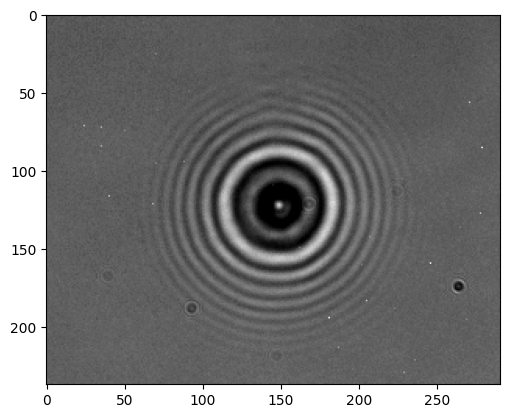

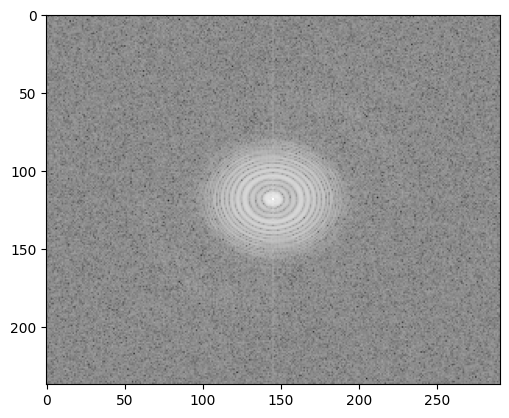

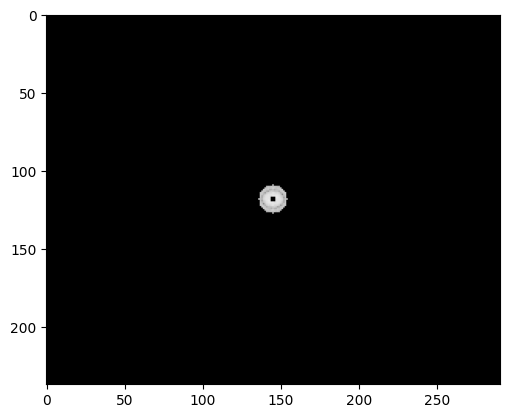

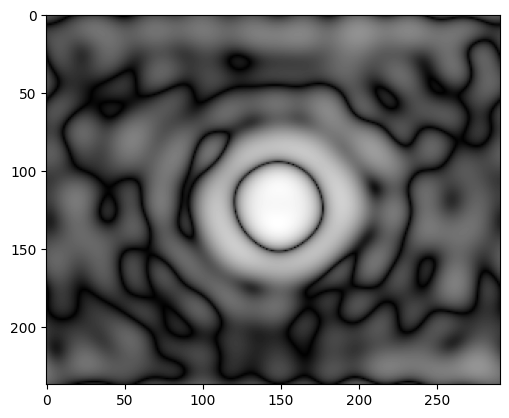

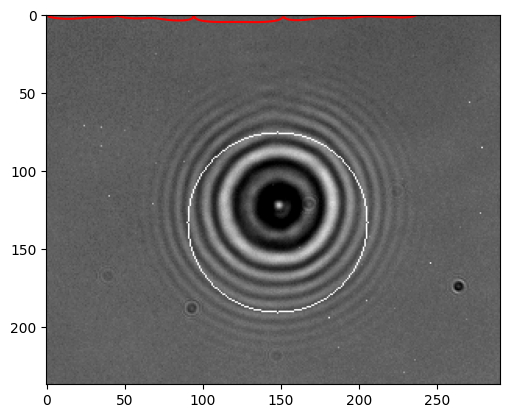

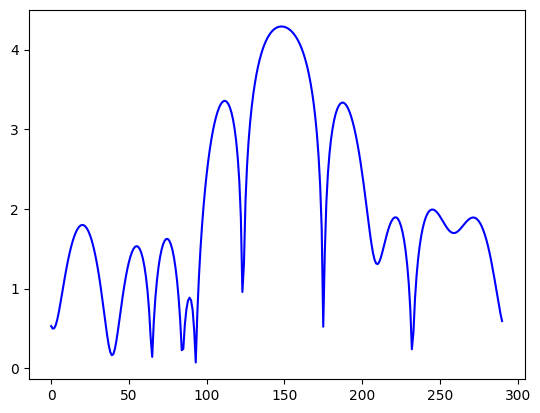

Processed image saved to: ResultsTest_4\processed_frame_000000.png


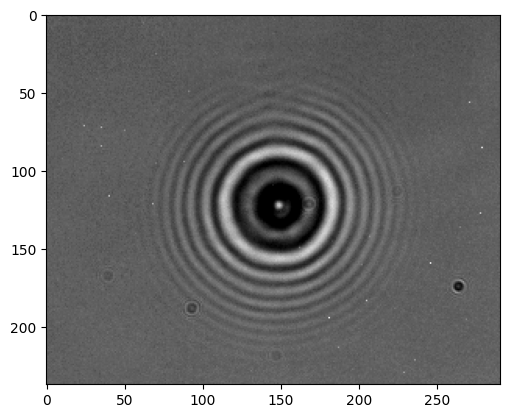

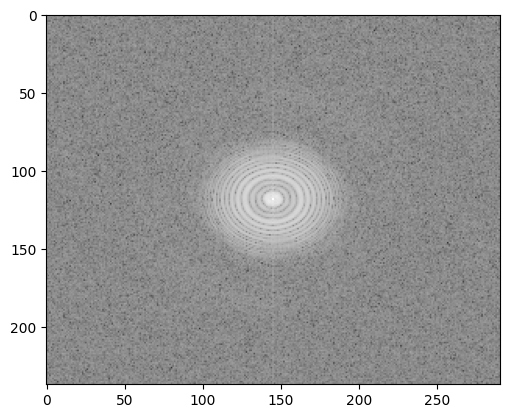

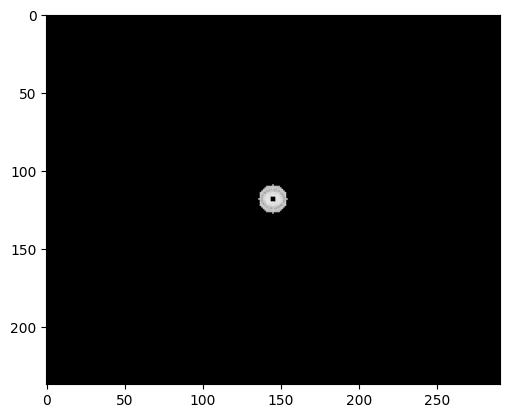

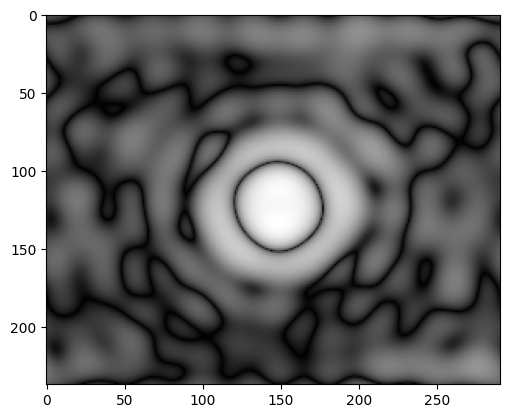

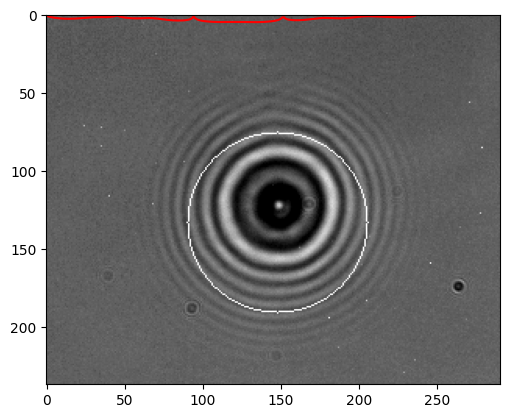

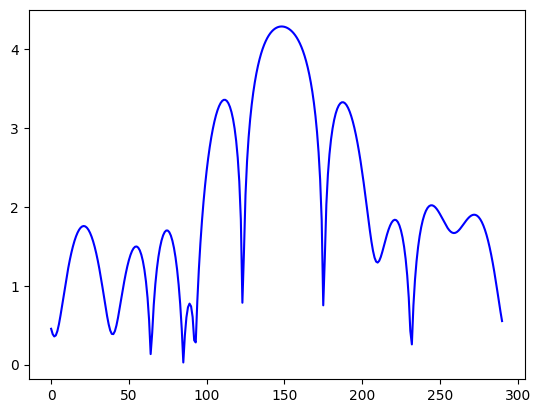

Processed image saved to: ResultsTest_4\processed_frame_000001.png


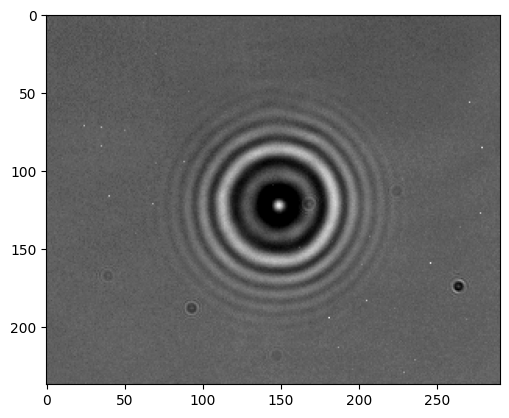

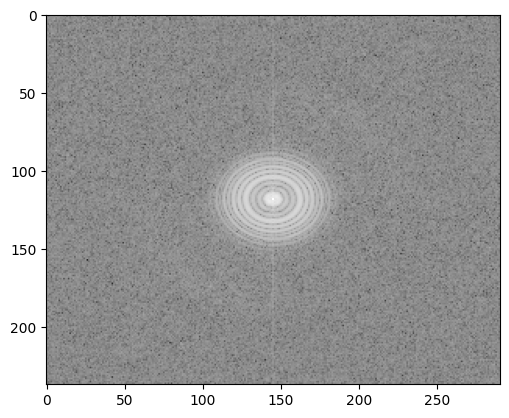

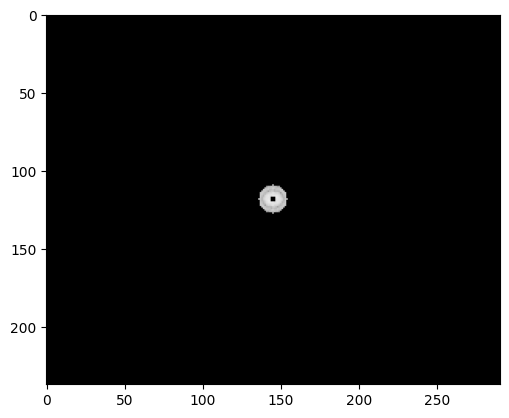

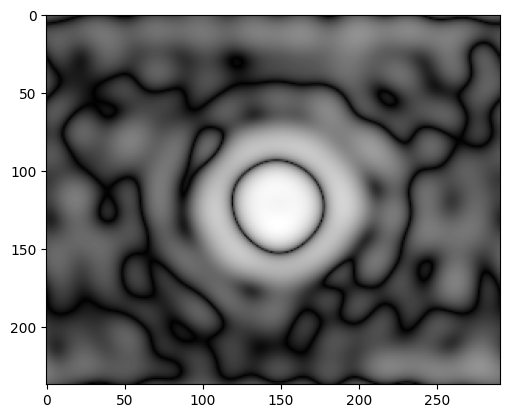

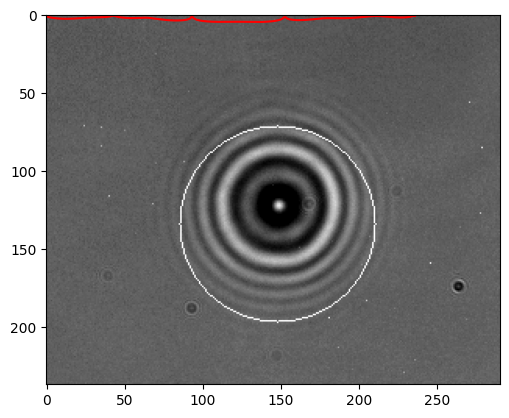

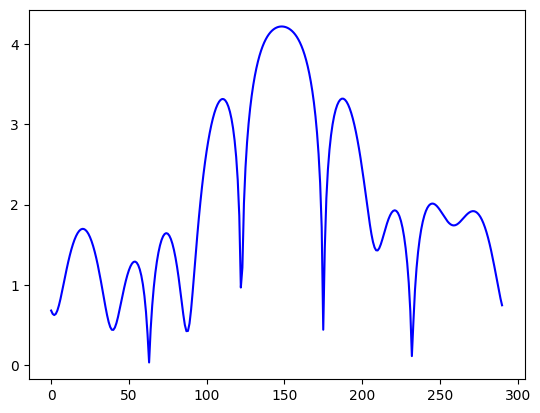

Processed image saved to: ResultsTest_4\processed_frame_000002.png


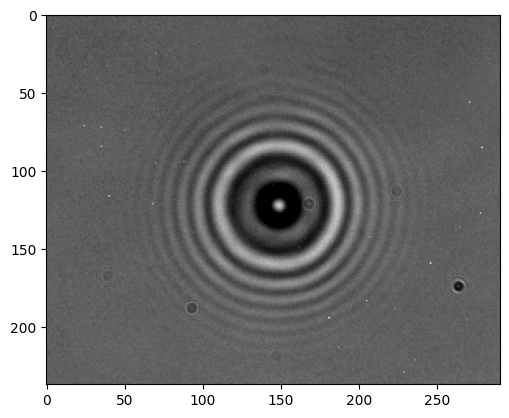

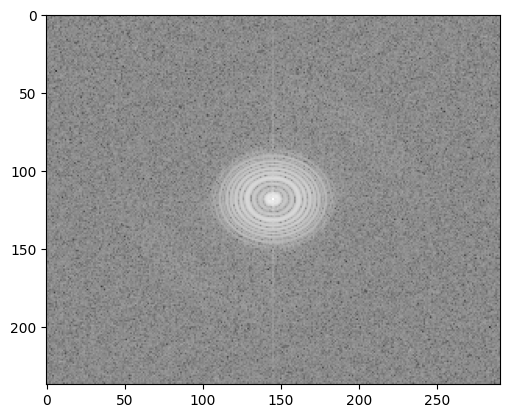

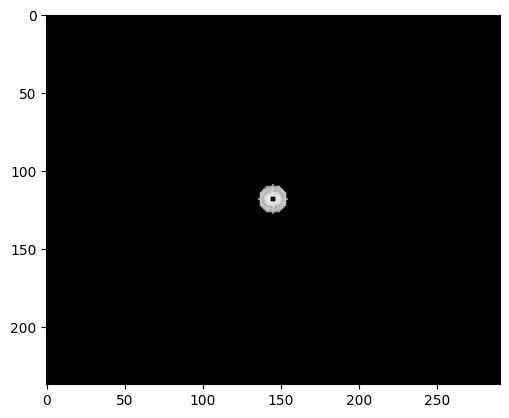

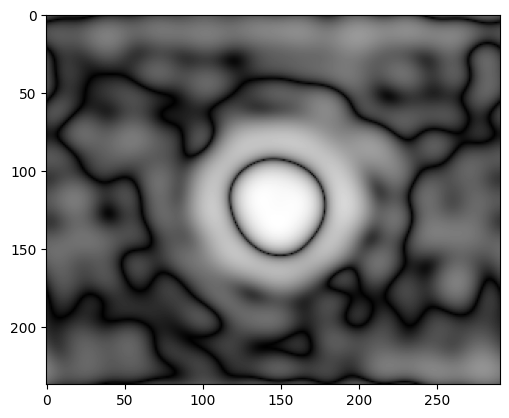

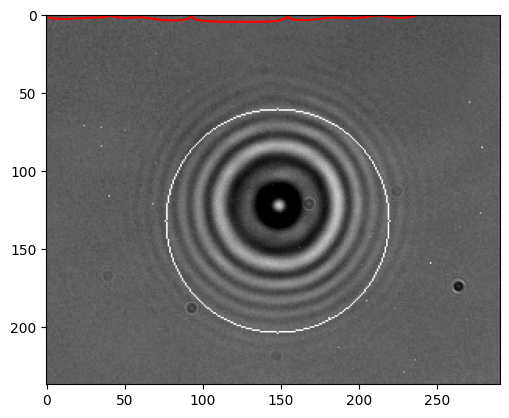

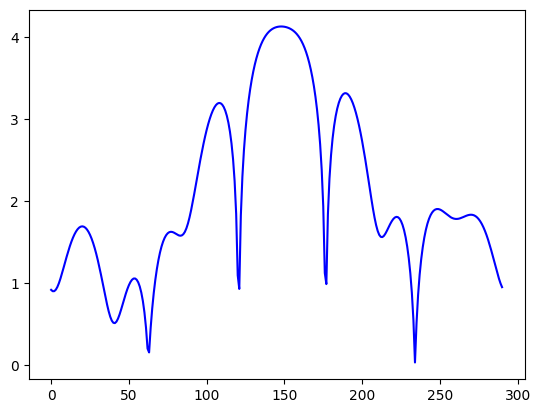

Processed image saved to: ResultsTest_4\processed_frame_000003.png


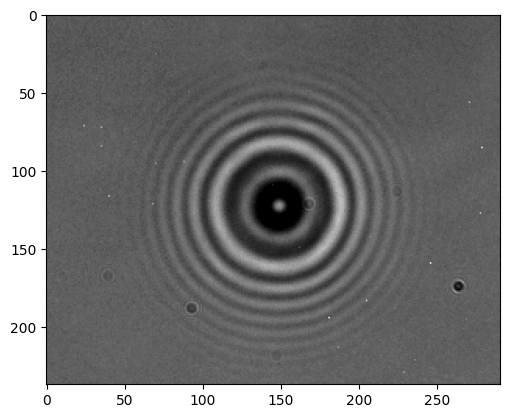

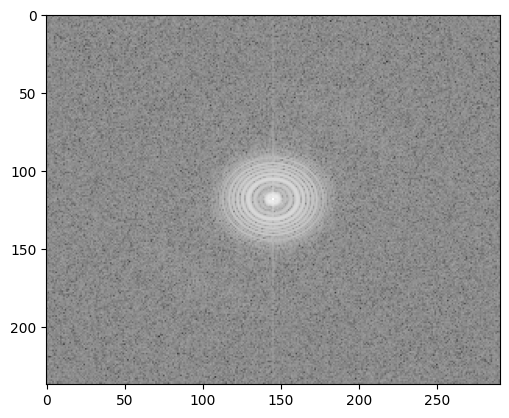

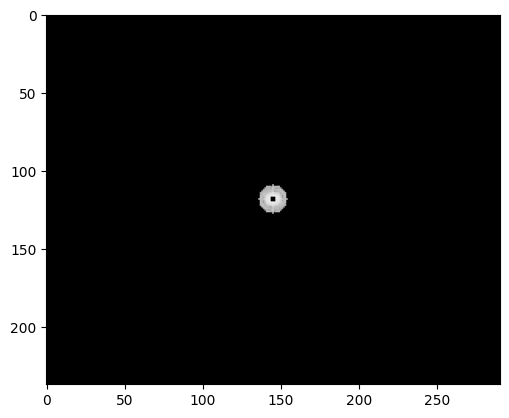

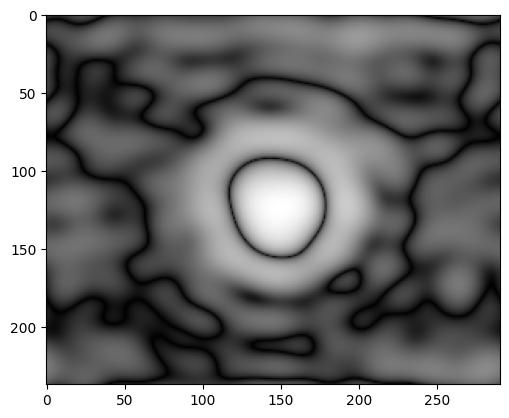

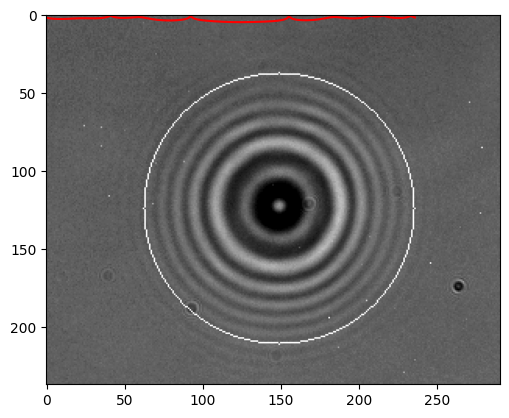

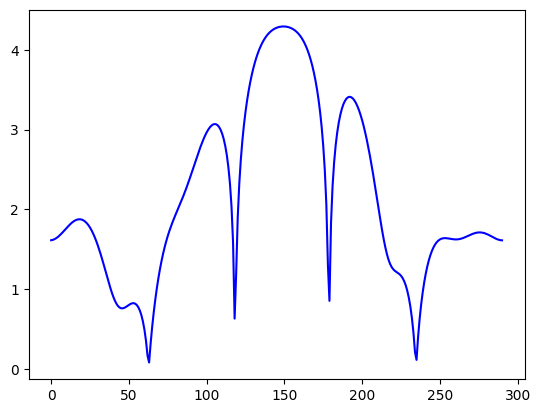

Processed image saved to: ResultsTest_4\processed_frame_000004.png


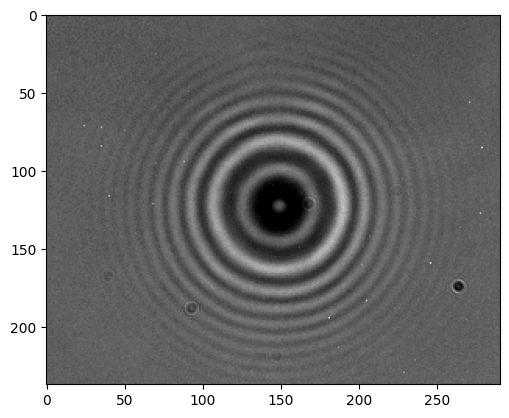

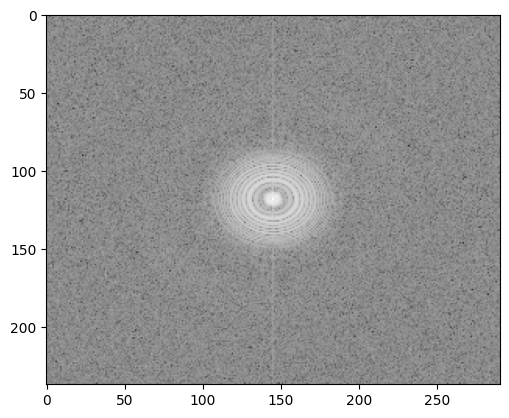

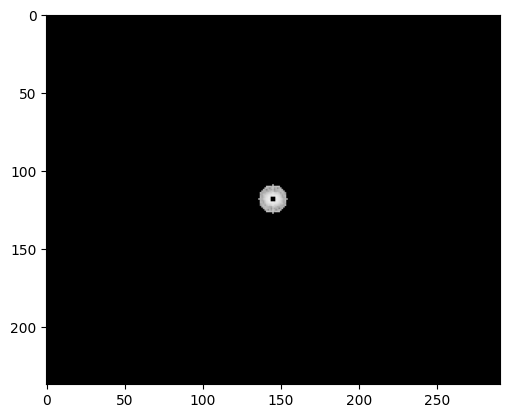

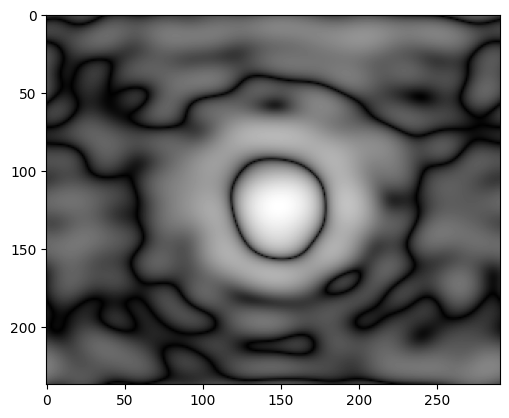

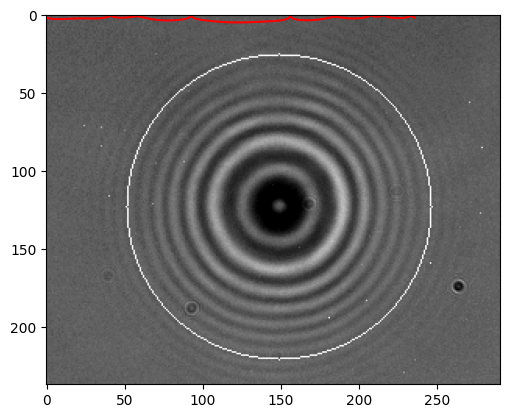

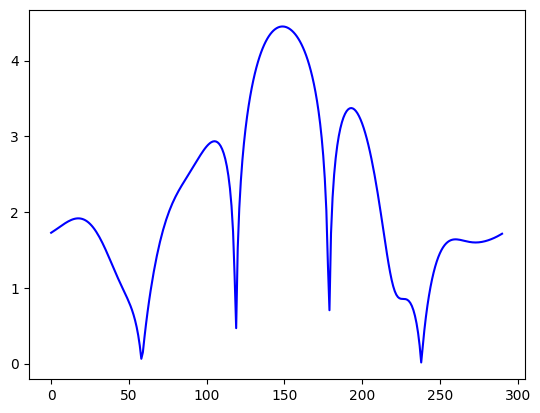

Processed image saved to: ResultsTest_4\processed_frame_000005.png


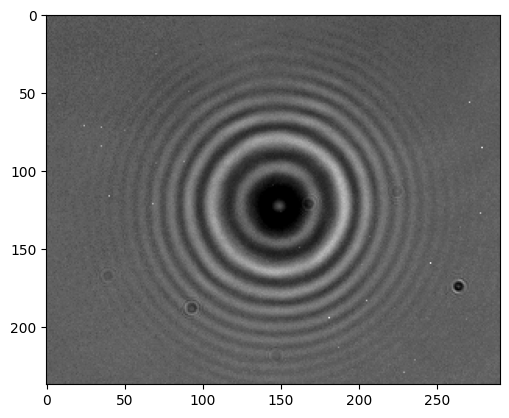

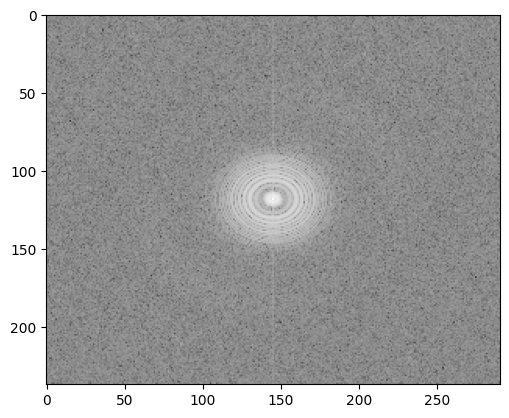

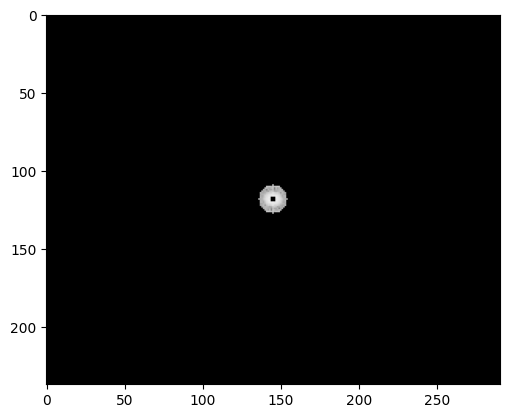

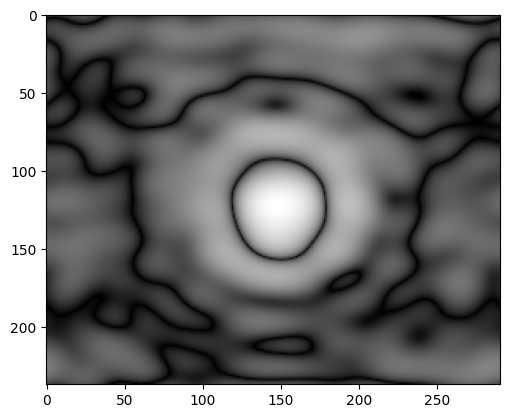

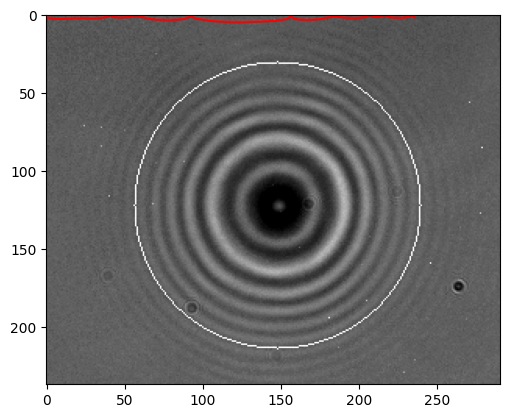

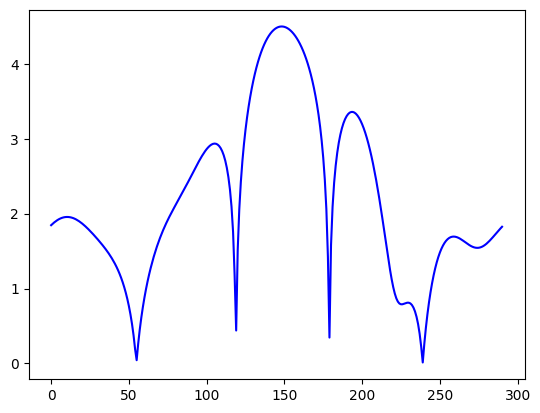

Processed image saved to: ResultsTest_4\processed_frame_000006.png


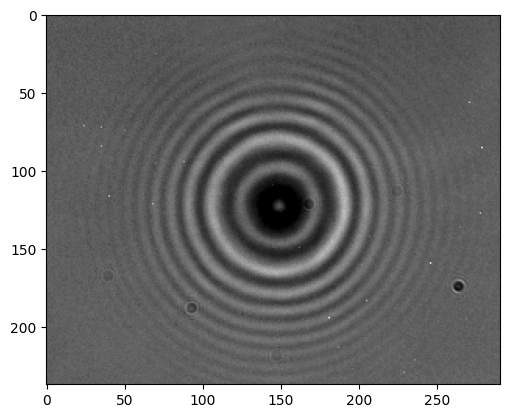

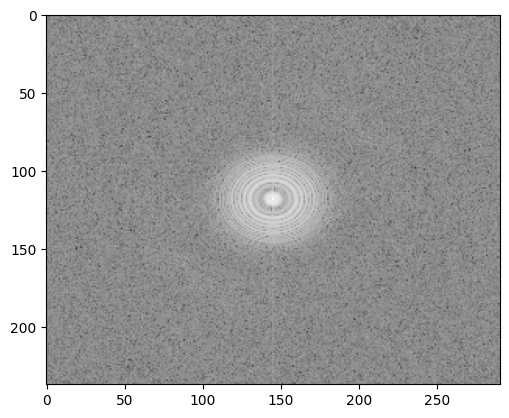

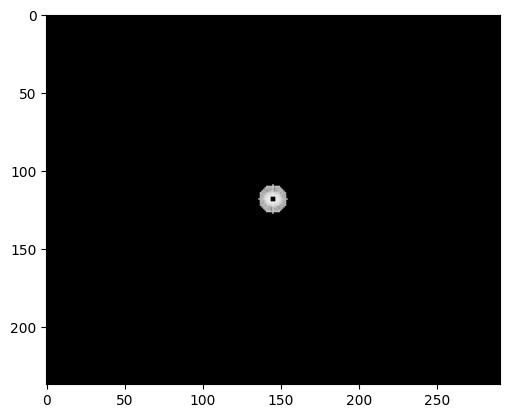

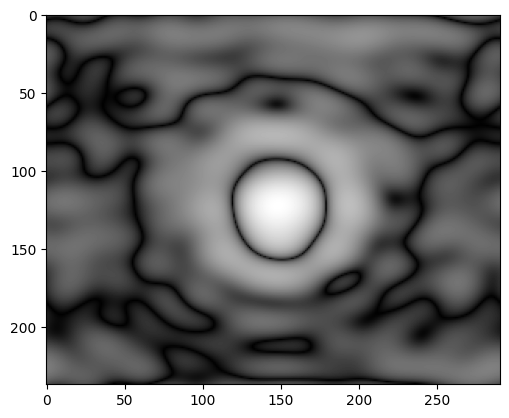

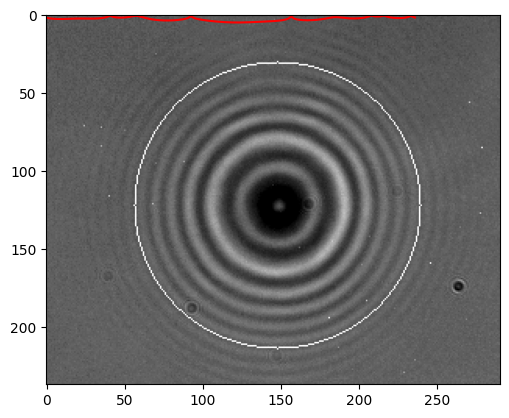

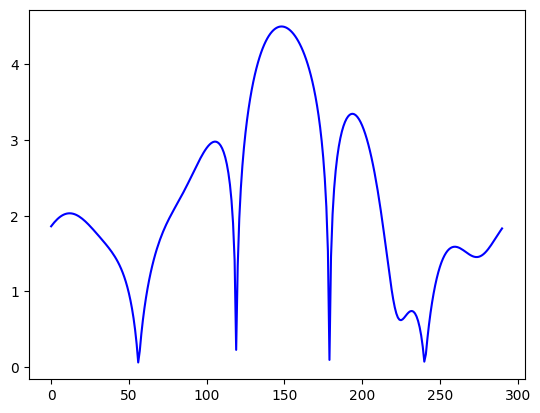

Processed image saved to: ResultsTest_4\processed_frame_000007.png


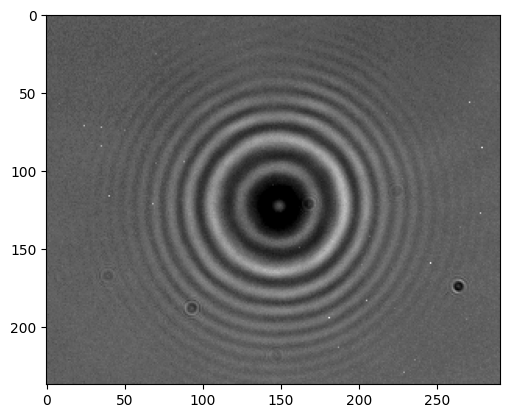

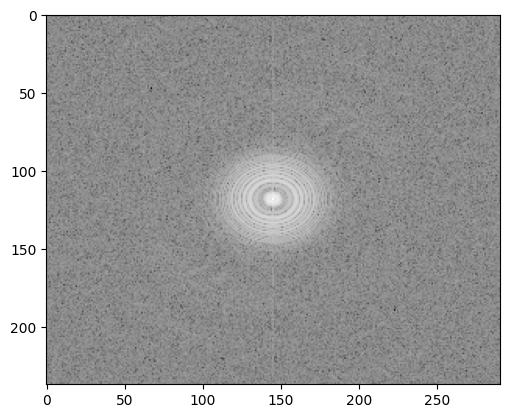

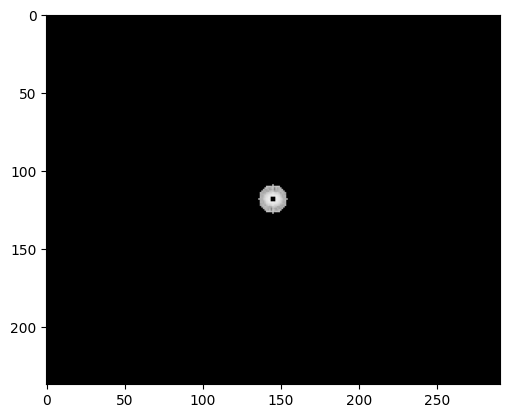

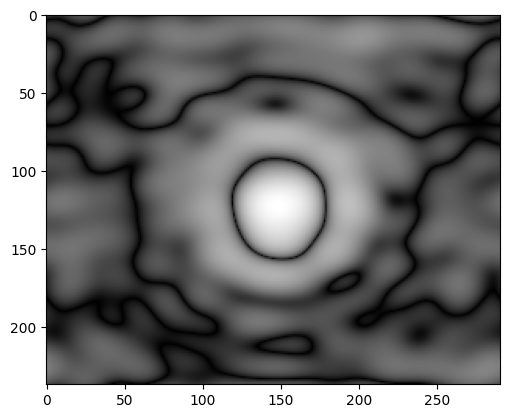

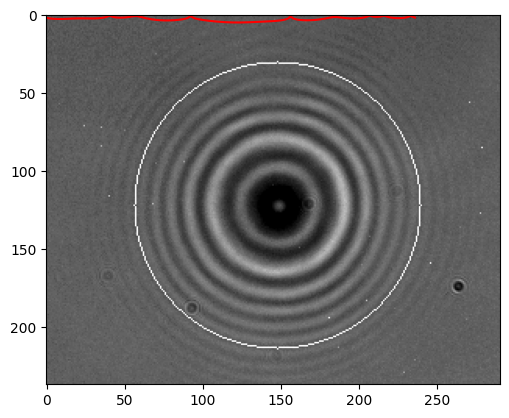

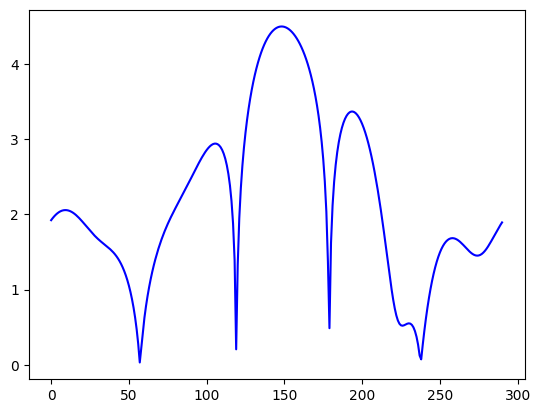

Processed image saved to: ResultsTest_4\processed_frame_000008.png


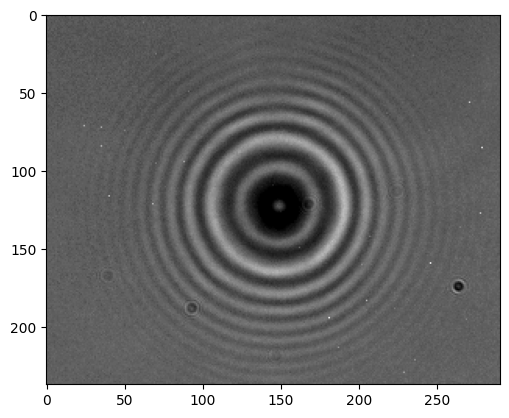

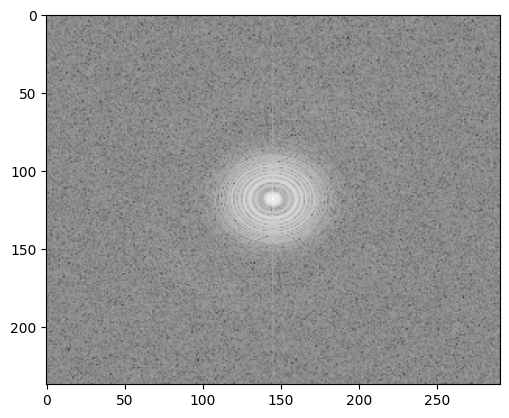

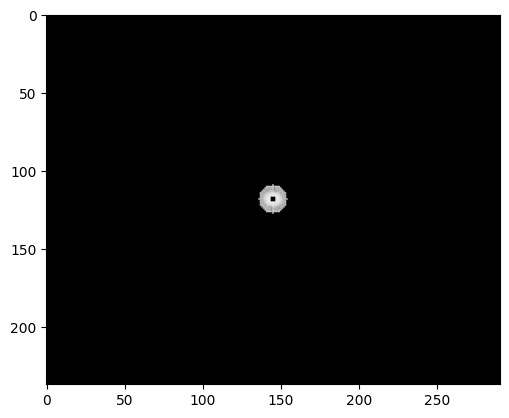

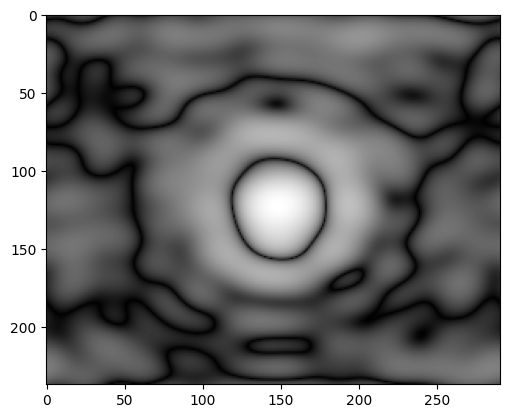

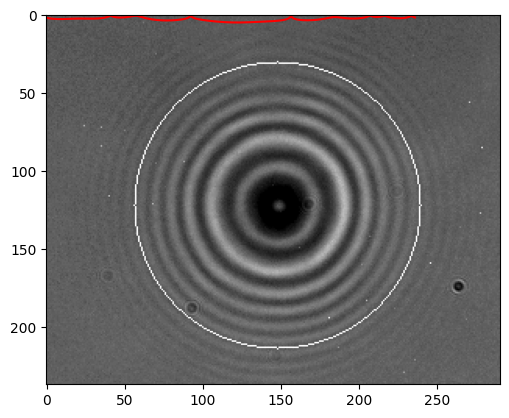

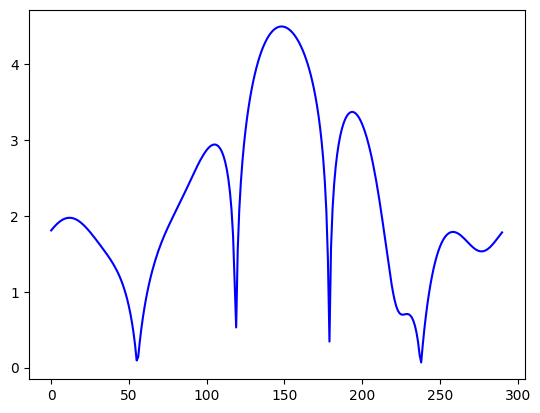

Processed image saved to: ResultsTest_4\processed_frame_000009.png


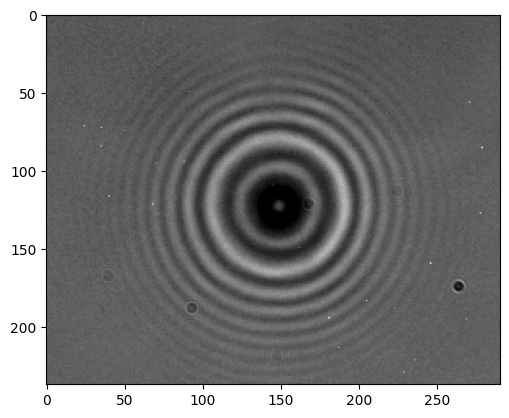

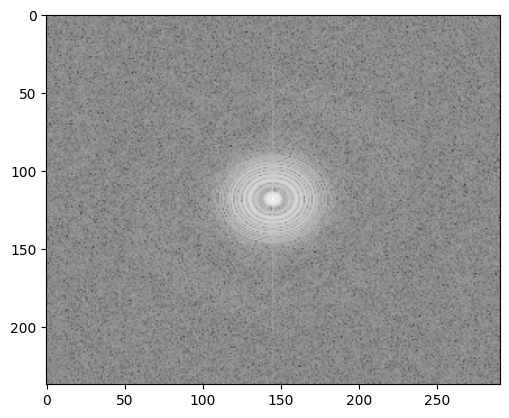

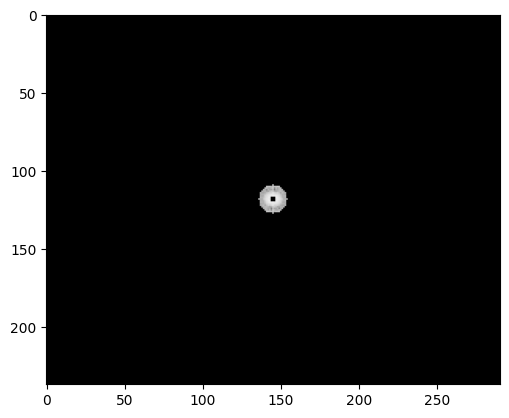

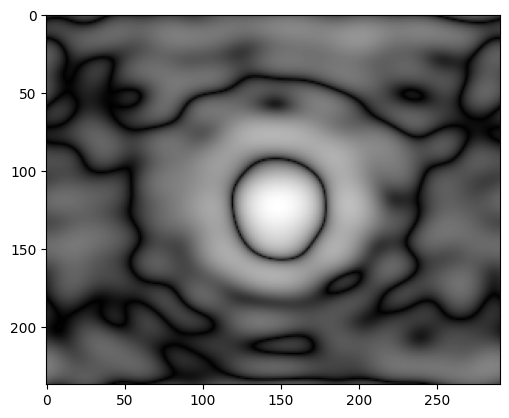

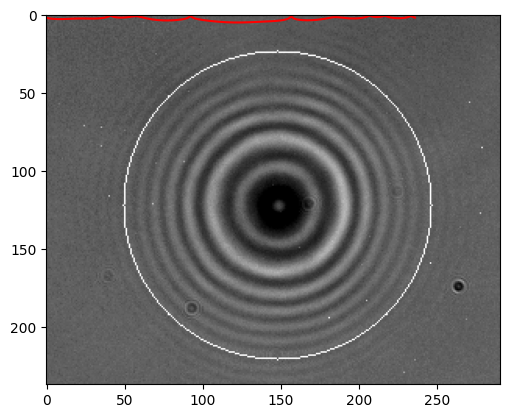

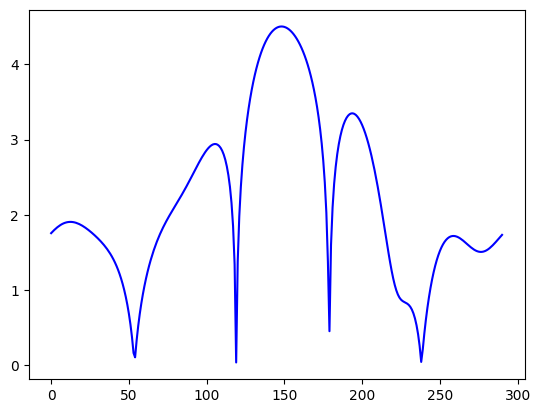

Processed image saved to: ResultsTest_4\processed_frame_000010.png
All images processed and saved.


In [45]:
def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))  # Reading the file
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("done png extraction")
    return

    # Specify the input TIFF file path and the output directory
'''
input_path = "/content/drive/MyDrive/Magistras/Files_06_06"
input_tiff = "Test_1.tif"
output_path = "/content/drive/MyDrive/Magistras/Rezultatas_05-16" + Path(input_tiff).stem
'''

input_path = "TestVideos"
input_tiff = "Test_4.tif"
output_path = "Results" + Path(input_tiff).stem

#create output dir
Path(output_path).mkdir(parents=True, exist_ok=True)

tiff_to_png(input_tiff, input_path, output_path)
for filename in os.listdir(output_path):
    file = os.path.join(output_path, filename)
    image = cv2.imread(file, cv2.IMREAD_GRAYSCALE)
    plt.imshow(image, cmap='gray', vmin = 0, vmax = 255)
    plt.show()
    #padded_image = np.pad(image, ((0, image.shape[0]), (0, image.shape[1])), mode='constant')
    ftimage = np.fft.fft2(image)
    ftimage = np.fft.fftshift(ftimage)
    plt.imshow(20*np.log(np.abs(ftimage)+1), cmap='gray', vmin = 0, vmax = 255)
    plt.show()

    #bandpass
    rows, cols = ftimage.shape
    crow, ccol = int(rows/2), int(cols/2)
    mask = np.zeros((rows, cols), np.uint8)
    r_in = 2
    r_out = 9
    center = [crow, ccol]
    x, y = np.ogrid[:rows, :cols]
    mask_area = np.logical_and(((x-center[0])**2 + (y-center[1])**2 >= r_in**2),
                               ((x-center[0])**2 + (y-center[1])**2 <= r_out**2))
    mask[mask_area] = 1

    #apply mask
    m_app_ftimage = ftimage * mask
    plt.imshow(20 * np.log(np.abs(m_app_ftimage) + 1), cmap='gray', vmin = 0, vmax = 255)
    plt.show()

  #inverse shift
    i_ftimage = np.fft.ifftshift(m_app_ftimage)
    result_img = np.fft.ifft2(i_ftimage)
    tmp = np.log(np.abs(result_img) + 1)  #Balčiausio taško
    #img = cv2.magnitude(result_img[:, :, 0], result_img[:, :, 1])
    plt.imshow(tmp, cmap='gray', vmin = tmp.min(), vmax = tmp.max())
    plt.show()

    #get center x,y pixel
    crow, ccol = unravel_index(tmp.argmax(), tmp.shape)

    central_line_y = tmp[crow, :]
    central_line_y = np.roll(central_line_y, 0)
    central_line_x = tmp[:, ccol]
    central_line_x = np.roll(central_line_x, 0)

    peaks_x, _x = find_peaks(central_line_y, height=0.1)
    peaks_y, _y = find_peaks(central_line_x, height=0.1)

    rl_x = ccol - peaks_x[peaks_x.tolist().index(ccol) - 2]
    rr_x = peaks_x[peaks_x.tolist().index(ccol) + 2] - ccol

    ru_y = crow - peaks_y[peaks_y.tolist().index(crow) - 2]
    rl_y = peaks_y[peaks_y.tolist().index(crow) + 2] - crow

    circle_radius = round((rl_x + rr_x + ru_y + rl_y) /4., 0)

    # Window name in which image is displayed
    window_name = 'Image'

    # Center coordinates
    center_coordinates = (ccol, crow)

    # Radius of circle
    radius = int(circle_radius)

    # Blue color in BGR
    color = (255, 0, 0)

    # Line thickness of 2 px
    thickness = 1

    # Using cv2.circle() method
    # Draw a circle with blue line borders of thickness of 2 px
    image = cv2.circle(image, center_coordinates, radius, color, thickness)

    # Displaying the image

    plt.imshow(image, cmap='gray', vmin = 0, vmax = 255)
    plt.plot(central_line_x, color = 'red')
    plt.show()
    plt.plot(central_line_y, color='blue')
    plt.show()

# Save the processed image
    save_path = os.path.join(output_path, f"processed_{filename}")
    cv2.imwrite(save_path, image)
    print(f"Processed image saved to: {save_path}")

# End of the loop
print("All images processed and saved.")



In [ ]:
Kodas, kuris išsaugo originalą ir tarpinius apdirbimo variantus viename paveikslėlyje. Daugeliu atvejų nebuvo braižomas apskritimas, negeras kodas.

In [ ]:
import cv2
from pathlib import Path
from PIL import Image, ImageSequence
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import fft2, fftshift, ifft2, ifftshift
from numpy import unravel_index

def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("PNG extraction done")
'''
input_path = "/content/drive/MyDrive/Magistras/05-06_Guoda/Video1"
'''
# Define paths
input_path = ''
input_tiff = "Test_1.tif"
output_base_path = "/Test_5"

# Create output path for PNG images within a specific subfolder
output_path = Path(output_base_path) / Path(input_tiff).stem
output_path.mkdir(parents=True, exist_ok=True)

# Convert TIFF to PNG
tiff_to_png(input_tiff, input_path, output_path)

# Results folder setup
result_folder = "/content/drive/MyDrive/Magistras/Results_06_06/" + Path(input_tiff).stem + "_results_1"
Path(result_folder).mkdir(parents=True, exist_ok=True)

for filename in os.listdir(output_path):
    file_path = os.path.join(output_path, filename)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    # Original image
    axes[0].imshow(image, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original Image')

    # FFT image
    ftimage = fft2(image)
    ftimage = fftshift(ftimage)
    axes[1].imshow(20 * np.log(np.abs(ftimage) + 1), cmap='gray', vmin=0, vmax=255)
    axes[1].set_title('Fourier Transform')

    # Bandpass filter
    rows, cols = ftimage.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=np.uint8)
    r_in, r_out = 2, 9
    x, y = np.ogrid[:rows, :cols]
    mask_area = np.logical_and(((x - crow)**2 + (y - ccol)**2 >= r_in**2),
                               ((x - crow)**2 + (y - ccol)**2 <= r_out**2))
    mask[mask_area] = 1
    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Bandpass Filter')

    # Apply mask and inverse shift
    m_app_ftimage = ftimage * mask
    i_ftimage = ifftshift(m_app_ftimage)
    result_img = ifft2(i_ftimage)
    tmp = np.log(np.abs(result_img) + 1)
    axes[3].imshow(tmp, cmap='gray', vmin=tmp.min(), vmax=tmp.max())
    axes[3].set_title('Filtered Image')

    # Intensity Profile
    axes[4].plot(tmp[int(tmp.shape[0]/2), :], color='blue')  # Mid-horizontal line intensity profile
    axes[4].set_title('Intensity Profile')

    # Peak detection and circle drawing logic
    crow, ccol = unravel_index(tmp.argmax(), tmp.shape)
    central_line_y = tmp[crow, :]
    central_line_x = tmp[:, ccol]
    peaks_y, _ = find_peaks(central_line_y, height=0.1)
    peaks_x, _ = find_peaks(central_line_x, height=0.1)
    if len(peaks_x) > 1 and len(peaks_y) > 1:
        closest_peak_x = min(peaks_x, key=lambda x: abs(x-ccol))
        closest_peak_y = min(peaks_y, key=lambda y: abs(y-crow))
        peak_index_x = peaks_x.tolist().index(closest_peak_x)
        peak_index_y = peaks_y.tolist().index(closest_peak_y)
        if peak_index_x > 1 and peak_index_x < len(peaks_x) - 2 and peak_index_y > 1 and peak_index_y < len(peaks_y) - 2:
            rl_x = ccol - peaks_x[peak_index_x - 2]
            rr_x = peaks_x[peak_index_x + 2] - ccol
            ru_y = crow - peaks_y[peak_index_y - 2]
            rl_y = peaks_y[peak_index_y + 2] - crow
            circle_radius = round((rl_x + rr_x + ru_y + rl_y) / 4., 0)
            circle_img = cv2.circle(image.copy(), (ccol, crow), int(circle_radius), (255, 0, 0), 2)
            axes[5].imshow(circle_img, cmap='gray', vmin=0, vmax=255)
            axes[5].set_title('Result with Circle')
        else:
            axes[5].imshow(image, cmap='gray', vmin=0, vmax=255)
            axes[5].set_title('Result with Circle (No valid peaks)')

    plt.tight_layout()
    plt.savefig(os.path.join(result_folder, f"composite_{filename}"))
    plt.show()

print("All images processed and saved in the results folder.")


This cell output is too large and can only be displayed while logged in.


# Pradinis

Pabandžiau pašalinti tą keistą apribojimą dėl artimiausių taškų atstumo, kurį man sugeneravo, kai įvedinėjau error'o pranešimą. Ir taip pat pridėjau, kad iškart ištrauktų parametrus, kurie davė error'ą į excel failą.

In [ ]:
import cv2
from pathlib import Path
from PIL import Image, ImageSequence
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import fft2, fftshift, ifft2, ifftshift
from numpy import unravel_index
import pandas as pd

# params
r_in, r_out = 3, 9
# r_in, r_out = 3,7
ring_index=1

#  Dėl dydžio keitimo reguliavimo
prev_circle=None
prev_circle_radius=None
allowed_circle_radius_upper=1.1 #circle_radius gali skirtis max sita procenta
allowed_circle_radius_upper=0.9
prev_ccol=None
prev_crow=None


def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("PNG extraction done")

input_path = 'Tiffs'
input_tiff = "Test_4.tif"
output_base_path = "/Results/Test_4"
output_path = Path(output_base_path) / Path(input_tiff).stem
output_path.mkdir(parents=True, exist_ok=True)
tiff_to_png(input_tiff, input_path, output_path)

result_folder = "" + Path(input_tiff).stem + "_Results_bw37_2"
Path(result_folder).mkdir(parents=True, exist_ok=True)

error_log = []

for filename in os.listdir(output_path):
    file_path = os.path.join(output_path, filename)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    imageBright = cv2.convertScaleAbs(image,10,1.5)

    # fig, axes = plt.subplots(2, 3, figsize=(15, 10)) #Orig
    fig, axes = plt.subplots(2, 4, figsize=(15, 10))
    axes = axes.ravel()

    axes[0].imshow(image, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original Image')

    ftimage = fft2(imageBright)
    ftimage = fftshift(ftimage)
    axes[1].imshow(20 * np.log(np.abs(ftimage) + 1), cmap='gray', vmin=0, vmax=255)
    axes[1].set_title('Fourier Transform')

    rows, cols = ftimage.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=np.uint8)
    # r_in, r_out = 3, 7
    x, y = np.ogrid[:rows, :cols]
    mask_area = np.logical_and(((x - crow)**2 + (y - ccol)**2 >= r_in**2),
                               ((x - crow)**2 + (y - ccol)**2 <= r_out**2))
    mask[mask_area] = 1
    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Bandpass Filter')

    m_app_ftimage = ftimage * mask
    i_ftimage = ifftshift(m_app_ftimage)
    result_img = ifft2(i_ftimage)
    tmp = np.log(np.abs(result_img) + 1)
    axes[3].imshow(tmp, cmap='gray', vmin=tmp.min(), vmax=tmp.max())
    axes[3].set_title('Filtered Image')

    axes[4].plot(tmp[int(tmp.shape[0]/2), :], color='blue')
    axes[4].set_title('Intensity Profile')

    crow, ccol = unravel_index(tmp.argmax(), tmp.shape)
    central_line_y = tmp[crow, :]
    central_line_x = tmp[:, ccol]

    peaks_y, _ = find_peaks(central_line_y, height=0.1)
    peaks_x, _ = find_peaks(central_line_x, height=0.1)

    if len(peaks_x) > 1 and len(peaks_y) > 1:
        # Adjusted peak selection to use closest peaks around ccol
        closest_peak_x = min(peaks_x, key=lambda x: abs(x-ccol))
        closest_peak_y = min(peaks_y, key=lambda y: abs(y-crow))

        # Use peak indices to find distances to closest peaks
        peak_index_x = peaks_x.tolist().index(closest_peak_x)
        peak_index_y = peaks_y.tolist().index(closest_peak_y)

        if peak_index_x > 0:
            rl_x = ccol - peaks_x[peak_index_x - ring_index]
            rr_x = peaks_x[peak_index_x + ring_index] - ccol

        if peak_index_y > 0:
            ru_y = crow - peaks_y[peak_index_y - ring_index]
            rl_y = peaks_y[peak_index_y + ring_index] - crow


        circle_radius = round((rl_x + rr_x + ru_y + rl_y) / 4., 0)

        if prev_circle is not None and circle_radius > prev_circle_radius * allowed_circle_radius_upper:
            ring_index=-1
            circle_radius=prev_circle_radius
            ccol=prev_ccol
            crow=prev_crow
        elif prev_circle is not None and circle_radius < prev_circle_radius * allowed_circle_radius_lower:
            ring_index=+1
            circle_radius=prev_circle_radius
            ccol=prev_ccol
            crow=prev_crow
            
        circle_img = cv2.circle(image.copy(), (ccol, crow), int(circle_radius), (255, 255, 0), 2)

        axes[5].imshow(circle_img, cmap='gray', vmin=0, vmax=255)
        axes[5].set_title('Result with Circle')
    else:
        error_log.append([filename, 'Frame with no valid peaks', r_in, r_out, 2])
        axes[5].imshow(image, cmap='gray', vmin=0, vmax=255)
        axes[5].set_title('Result with Circle (No valid peaks)')

    # Plot intensity profiles and highlight peaks
    axes[6].plot(central_line_y, color='blue')
    for peak in peaks_y:
        axes[6].axvline(x=peak, color='red', linestyle='--')  # Mark peaks with red dashed lines
    axes[6].set_title('Intensity Profile (Y-Axis) with Peaks')

    axes[7].plot(central_line_x, color='green')
    for peak in peaks_x:
        axes[7].axvline(x=peak, color='red', linestyle='--')  # Mark peaks with red dashed lines
    axes[7].set_title('Intensity Profile (X-Axis) with Peaks')


    plt.tight_layout()
    plt.savefig(os.path.join(result_folder, f"composite_{filename}"))
    plt.show()

if error_log:
    # Only save the CSV if there are errors
    error_df = pd.DataFrame(error_log, columns=['File', 'Frame', 'Band width r_in', 'Band width r_out', 'Value subtracted/added'])
    error_csv_path = Path('/content/drive/MyDrive/Magistras/Errors_06_06') / f"errors_{Path(input_tiff).stem}.csv"
    error_df.to_csv(error_csv_path, index=False)
    print("Error log saved to CSV.")
else:
    print("No errors to log.")

print("All images processed and saved in the results folder.")


# Watershed

done png extraction


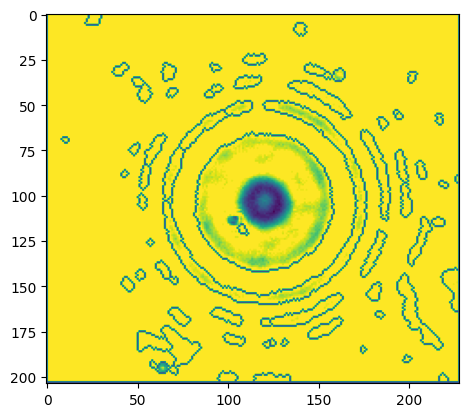

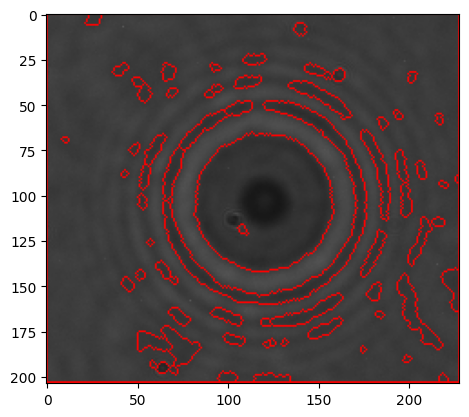

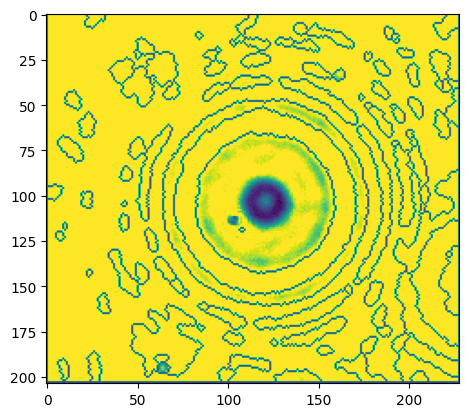

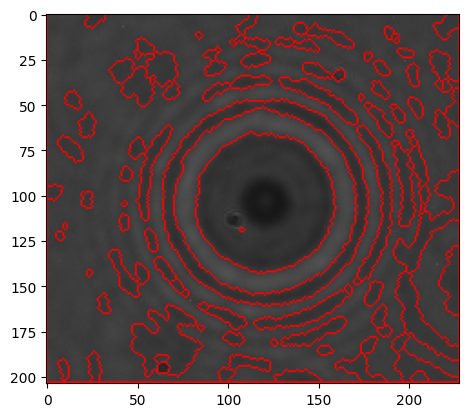

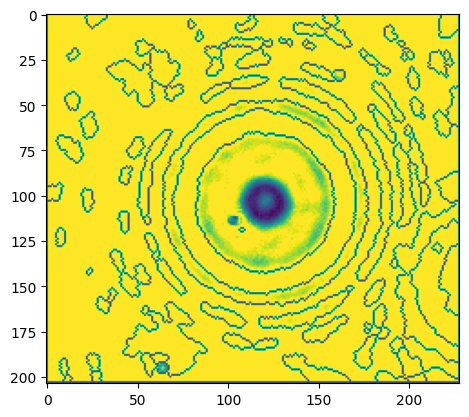

...

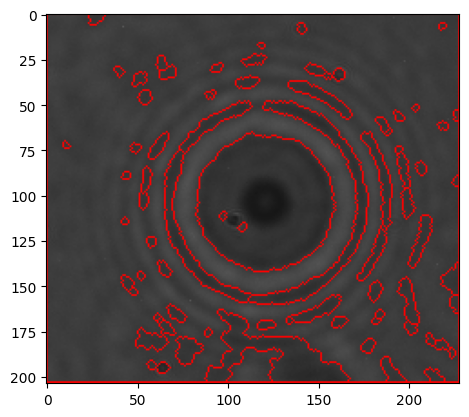

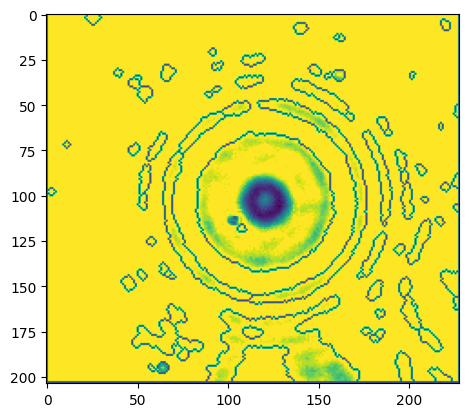

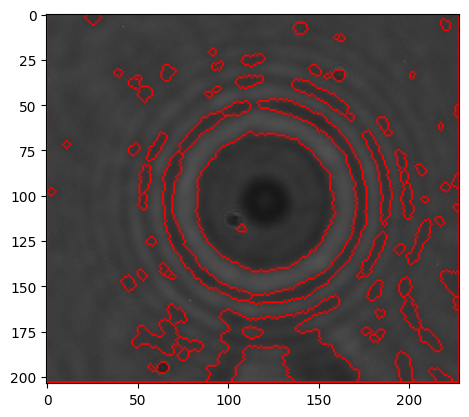

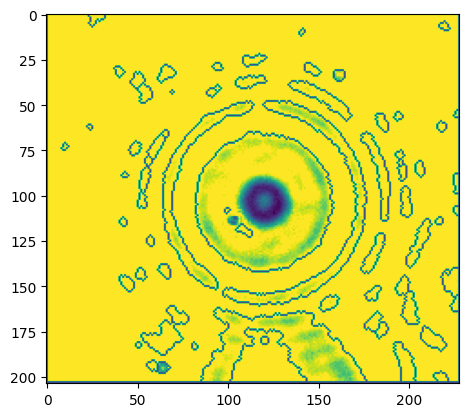

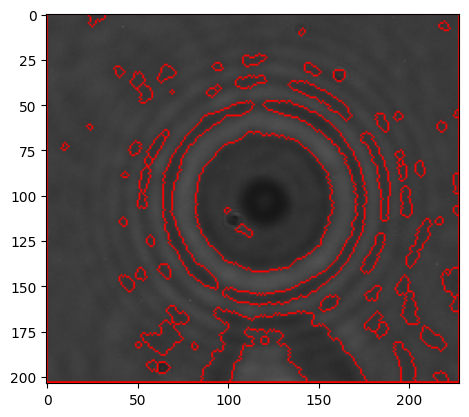

In [158]:
def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))  # Reading the file
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("done png extraction")
    return

input_path="TestVideos"
input_tiff="Test_8.tif"
output_base_path="Results"
output_path = "" + Path(input_tiff).stem

Path(output_path).mkdir(parents=True, exist_ok=True)

tiff_to_png(input_tiff, input_path, output_path)
for filename in os.listdir(output_path):
    # read image
    file = os.path.join(output_path, filename)
    image = cv2.imread(file)
    imageHiContrast=cv2.convertScaleAbs(image,10000,3.5)

    # convert to grayscale
    gray=cv2.cvtColor(imageHiContrast,cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    # plt.imshow(thresh)
    # plt.show()

    # noise
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)

    # background
    bg=cv2.dilate(opening,kernel,iterations=1)

    # foreground
    # dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    # ret, fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    fg=cv2.erode(opening,kernel)

    # unknown regions (either bacground or foreground)
    fg = np.uint8(fg)
    unknown = cv2.subtract(bg,fg)
    # plt.imshow(unknown)
    # plt.imshow(opening)
    # plt.show()

    # markers for components
    ret,markers = cv2.connectedComponents(fg)
    markers=markers+1
    markers[unknown==255] = 0
    
    markers = cv2.watershed(image,markers)
    image[markers == -1] = [255,0,0]

    contourMarkersBW=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    contourMarkers=cv2.convertScaleAbs(contourMarkersBW,100,5)
    plt.imshow(contourMarkers)
    plt.show()
    cnts=cv2.findContours(contourMarkers,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts=cnts[0] if len(cnts)==2 else cnts[1]
    for c in cnts:
        peri = cv2.arcLength(c,True)
        approx=cv2.approxPolyDP(c,0.04*peri,True)
        area=cv2.contourArea(c)
        if len(approx)>1 and area>1 and area<100:
            print("a")
            ((x,y),r)=cv2.minEnclosingCircle(c)
            cv2.circle(image,(int(x),int(y)),int(r),(0,255,0),2)

    # plt.imshow(markers)
    plt.imshow(image)
    plt.show()

    

done png extraction


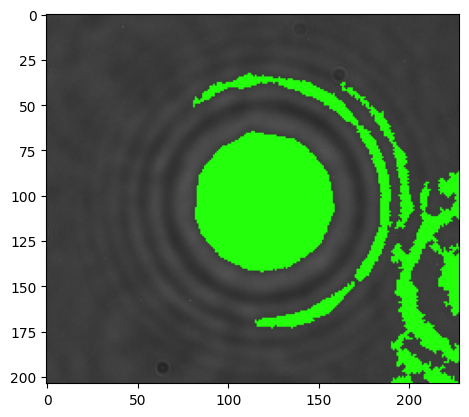

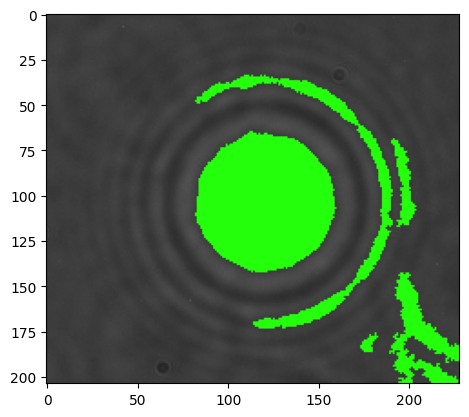

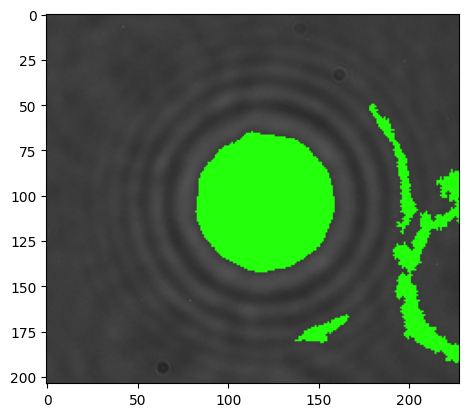

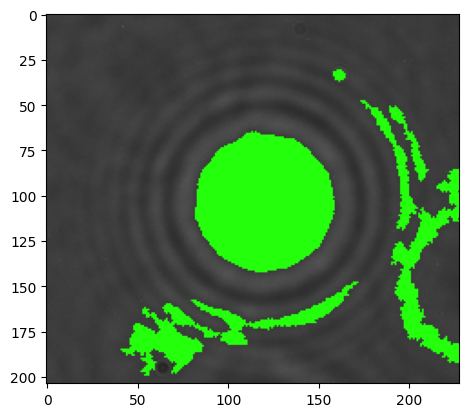

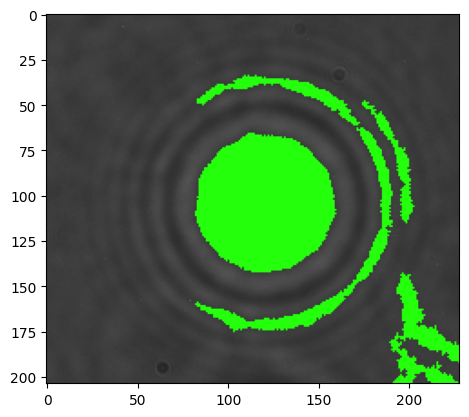

...

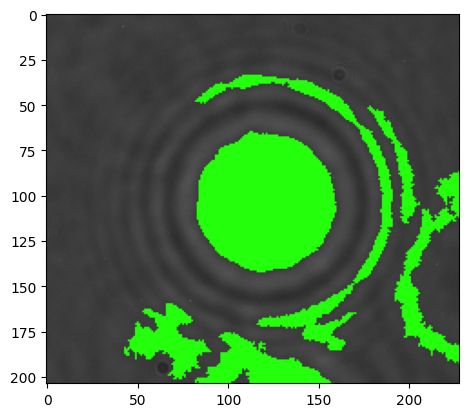

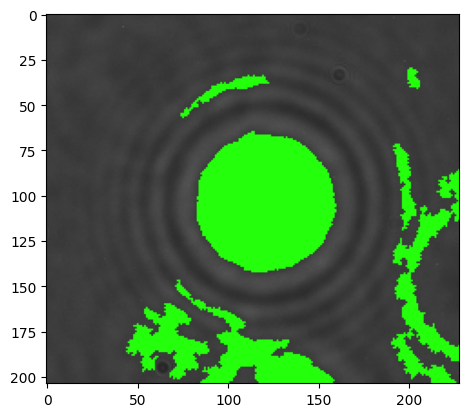

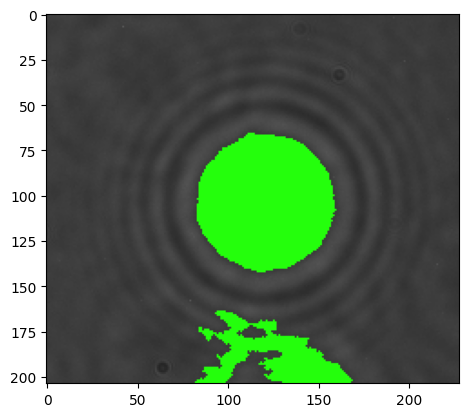

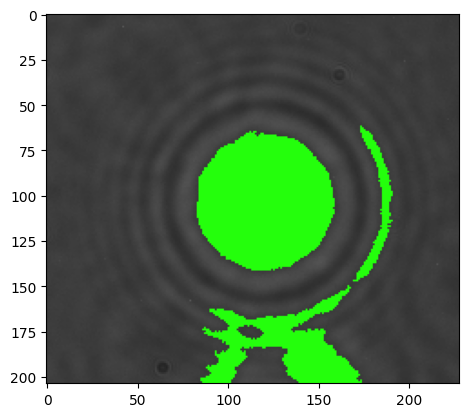

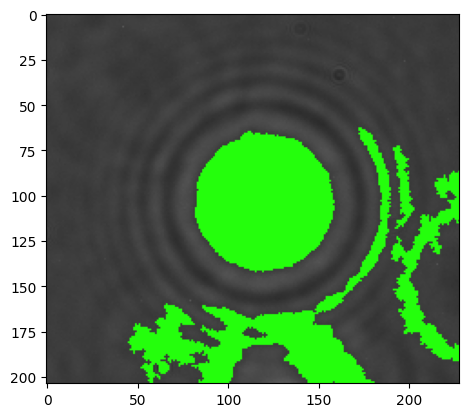

In [9]:
from scipy import ndimage
from skimage.feature import peak_local_max
from skimage.segmentation import watershed

def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))  # Reading the file
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("done png extraction")
    return


input_path="Tiffs"
input_tiff="Test_8.tif"
output_base_path="Results"
output_path = "" + Path(input_tiff).stem

Path(output_path).mkdir(parents=True, exist_ok=True)

tiff_to_png(input_tiff, input_path, output_path)
for filename in os.listdir(output_path):
    # read image
    file = os.path.join(output_path, filename)
    image = cv2.imread(file)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]


    # Remove small noise by filtering using contour area
    cnts = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnts = cnts[0] if len(cnts) == 2 else cnts[1]

    for c in cnts:
        if cv2.contourArea(c) < 1000:
            cv2.drawContours(thresh,[c], 0, (0,0,0), -1)

    # cv2.imshow('thresh', thresh)
    # plt.imshow(thresh)
    # plt.show()
    # Compute Euclidean distance from every binary pixel
    # to the nearest zero pixel then find peaks
    distance_map = ndimage.distance_transform_edt(thresh)
    # print(-distance_map)
    local_max = peak_local_max(distance_map, min_distance=20, labels=thresh)

    # Perform connected component analysis then apply Watershed
    # markers = ndimage.label(local_max, structure=np.ones((3, 3)))[0]
    # print(markers)
    # markersList=[[0 for col in range(len(thresh[0]))] for row in range(len(thresh))]

    markers = np.zeros_like(thresh, dtype=int)
    for i, coord in enumerate(local_max, start=1):
        markers[coord[0], coord[1]] = i

    labels = watershed(-distance_map, markers, mask=thresh)

    # print(labels)

    # Iterate through unique labels
    for label in np.unique(labels):
        if label == 0:
            continue

        # Create a mask
        mask = np.zeros(gray.shape, dtype="uint8")
        mask[labels == label] = 255

        # Find contours and determine contour area
        cnts = cv2.findContours(mask.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        cnts = cnts[0] if len(cnts) == 2 else cnts[1]
        c = max(cnts, key=cv2.contourArea)
        cv2.drawContours(image, [c], -1, (36,255,12), -1)

    # cv2.imshow('image', image)
    # cv2.waitKey()
    plt.imshow(image)
    plt.show()

# Countor filtering

done png extraction


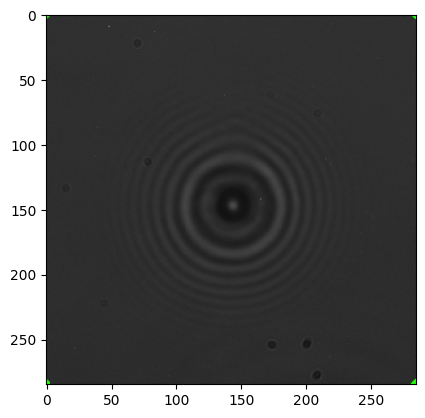

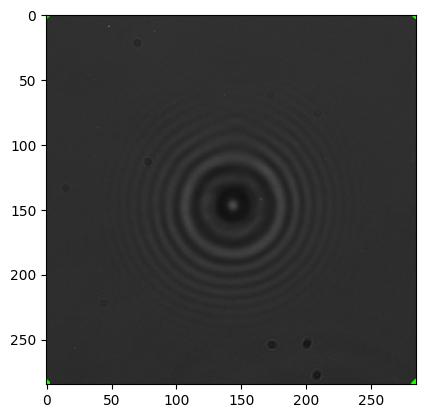

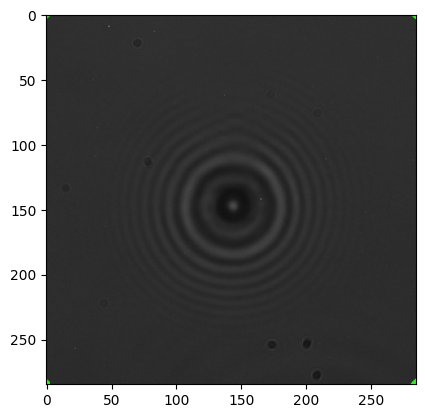

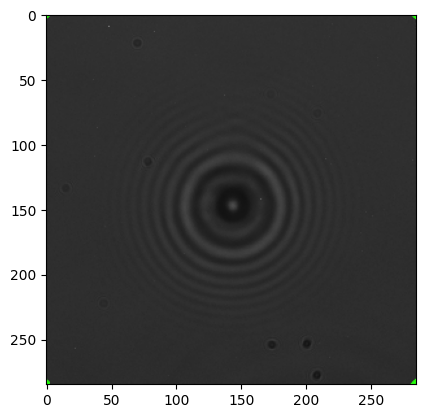

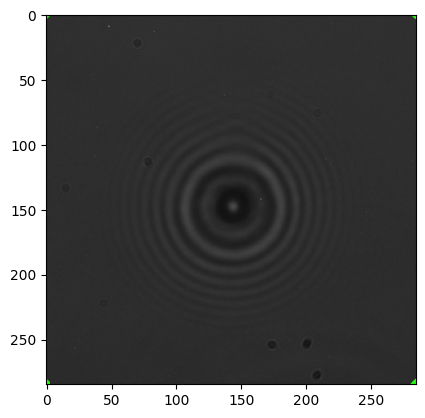

...

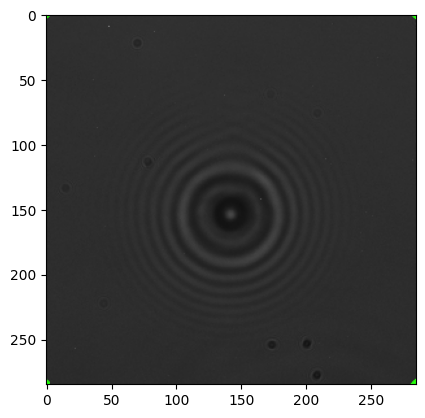

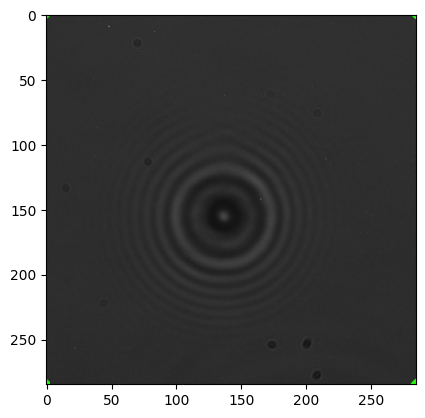

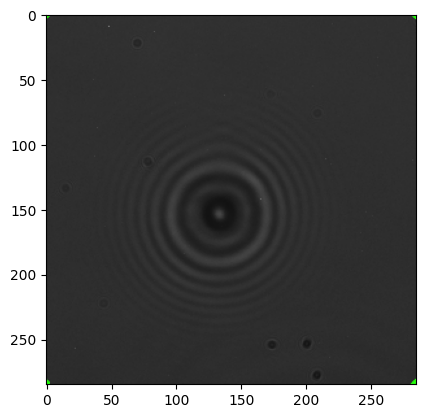

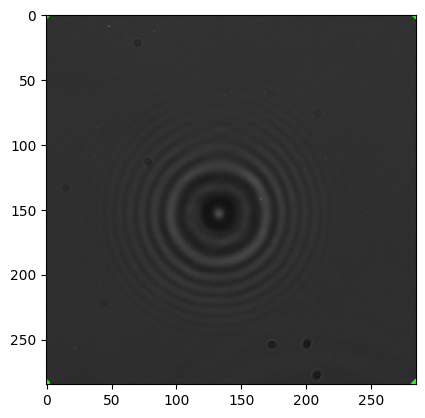

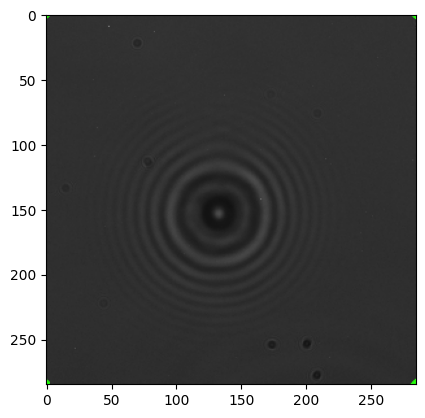

In [7]:
def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))  # Reading the file
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("done png extraction")
    return

input_path="Tiffs"
input_tiff="Test_5.tif"
output_base_path="Results"
output_path = "" + Path(input_tiff).stem

Path(output_path).mkdir(parents=True, exist_ok=True)

tiff_to_png(input_tiff, input_path, output_path)
for filename in os.listdir(output_path):
    # read image
    file = os.path.join(output_path, filename)
    image = cv2.imread(file)
    gray=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    blur=cv2.medianBlur(gray,11)
    thresh=cv2.threshold(blur,0,225,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]

    kernel=cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,1))
    opening=cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel,iterations=3)

    cnts=cv2.findContours(opening,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    cnts=cnts[0] if len(cnts)==2 else cnts[1]
    for c in cnts:
        peri = cv2.arcLength(c,True)
        approx=cv2.approxPolyDP(c,0.04*peri,True)
        area=cv2.contourArea(c)
        if True:
            ((x,y),r)=cv2.minEnclosingCircle(c)
            cv2.circle(image,(int(x),int(y)),int(r),(36,255,12),2)
    # plt.imshow(thresh)
    # plt.imshow(opening)
    plt.imshow(image)
    plt.show()

# Watershed hough


In [ ]:
def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))  # Reading the file
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("done png extraction")
    return

input_path="Tiffs"
input_tiff="Test_375.tif"
output_base_path="Results"
output_path = "" + Path(input_tiff).stem

Path(output_path).mkdir(parents=True, exist_ok=True)

tiff_to_png(input_tiff, input_path, output_path)
for filename in os.listdir(output_path):
    # read image
    file = os.path.join(output_path, filename)
    image = cv2.imread(file)
    imageHiContrast=cv2.convertScaleAbs(image,30,2.5)

    # convert to grayscale
    gray=cv2.cvtColor(imageHiContrast,cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(gray,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    # plt.imshow(thresh)
    # plt.show()

    # noise
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)

    # background
    bg=cv2.dilate(opening,kernel,iterations=1)

    # foreground
    # dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    # ret, fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    fg=cv2.erode(opening,kernel)

    # unknown regions (either bacground or foreground)
    fg = np.uint8(fg)
    unknown = cv2.subtract(bg,fg)
    # plt.imshow(unknown)
    # plt.imshow(opening)
    # plt.show()

    # markers for components
    ret,markers = cv2.connectedComponents(fg)
    markers=markers+1
    markers[unknown==255] = 0
    
    markers = cv2.watershed(image,markers)
    image[markers == -1] = [255,0,0]

    labels=np.unique(markers)
    for label in labels:
        y,x=np.nonzero(markers==label)
        cx=int(np.mean(x))
        cy=int(np.mean(y))
        


    minDist=100
    param1=30
    param2=50
    minRadius=5
    maxRadius=100

    # markersBW=cv2.cvtColor(markers,cv2.COLOR_BGR2GRAY)
    # circles=cv2.HoughCircles(markersBW,cv2.HOUGH_GRADIENT,1,minDist,param1=param1,param2=param2,minRadius=minRadius,
                            #  maxRadius=maxRadius)

    # plt.imshow(image)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian blur
    blurred = cv2.GaussianBlur(gray, (9, 9), 2)

    # Apply Hough Circle Transform
    circles = cv2.HoughCircles(blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100, param1=100, param2=30, minRadius=50, maxRadius=150)

    # If circles are detected, draw the outermost circle
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        
        # Find the outermost circle (circle with the largest radius)
        outermost_circle = max(circles, key=lambda x: x[2])
        
        # Draw the outermost circle
        cv2.circle(image, (outermost_circle[0], outermost_circle[1]), outermost_circle[2], (0, 255, 0), 3)

    # Display the image with the detected circle
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()
    
    
    # plt.imshow(markers)
    # plt.imshow(image)
    plt.show()

    

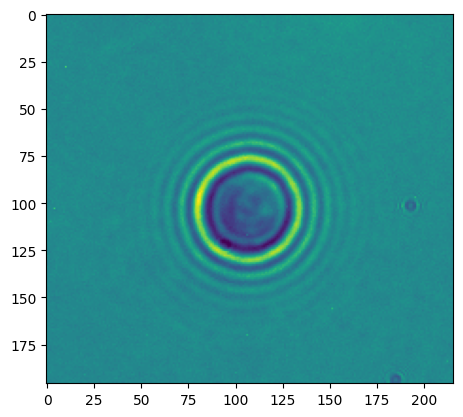

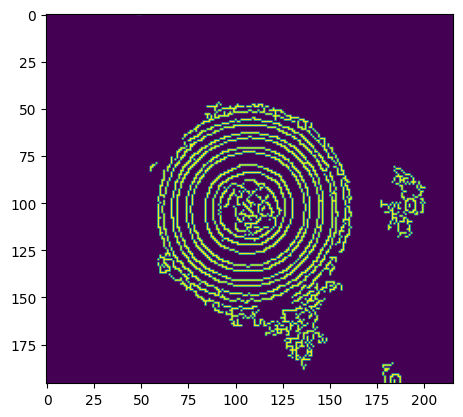

Average Center: (104, 102)


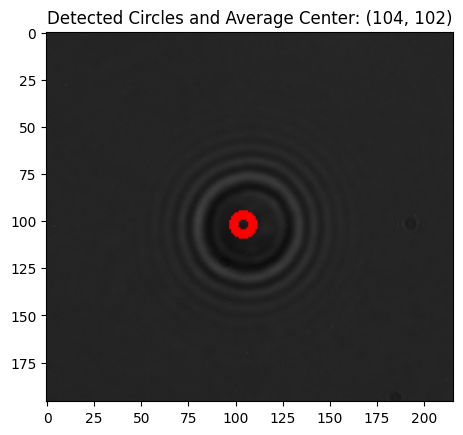

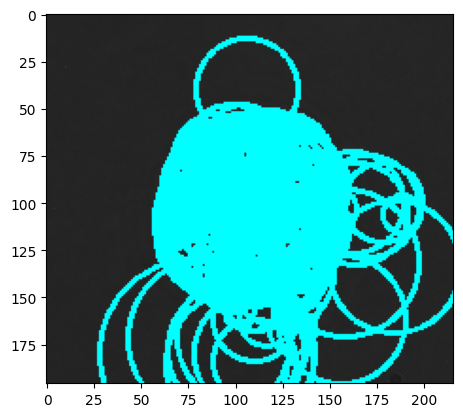

'Test_375'

In [60]:

# Load the image
image_path = 'Test_375/frame_000008.png'
# image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

image = cv2.imread(image_path)
image_center=image.copy()
image=cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)

# plt.imshow(image)
# plt.show()

# Ensure at least one circle is detected
# Normalize the image for better contrast
normalized_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
imageHiContrast=cv2.convertScaleAbs(normalized_image,10000,2)
plt.imshow(normalized_image)
plt.show()
# Apply Canny edge detection again on the normalized image
edges = cv2.Canny(imageHiContrast, threshold1=30, threshold2=150)
# edges = cv2.Canny(normalized_image, threshold1=30, threshold2=150)

plt.imshow(edges)
plt.show()

# edges=cv2.cvtColor(edges,cv2.COLOR_GRAY2BGR)

# plt.imshow(edges)
# plt.show()
# edges=np.uint8(edges)

# Run the Hough Circle Transform again on the enhanced edge-detected image
circles = cv2.HoughCircles(edges, 
                           cv2.HOUGH_GRADIENT, dp=1, minDist=5,
                           param1=40, param2=20, minRadius=5, maxRadius=70)

# # Ensure at least one circle is detected
# output_path = None
# if circles is not None:
#     # Convert circles into integers
#     circles = np.round(circles[0, :]).astype("int")

#     # Sort circles by radius (largest first)
#     circles = sorted(circles, key=lambda x: x[2], reverse=True)

#     # Get the largest circle (first in sorted list)
#     # largest_circle = circles[0]
#     largest_circle = circles[-1]

#     # Create a copy of the original image to draw the circle
#     output_image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

#     # Draw the largest circle
#     # cv2.circle(output_image, (largest_circle, largest_circle), largest_circle[2], (0, 255, 0), 4)

#     # Optionally, draw the center of the circle
#     # cv2.circle(output_image, (largest_circle[0], largest_circle[1]), 2, (0, 0, 255), 3)
#     cv2.circle(output_image, (largest_circle[0], largest_circle[1]), 2, (0, 0, 255), 3)

#     # Save the output image
#     output_path = "/mnt/data/circle_detected_v4.png"
#     # cv2.imwrite(output_path, output_image)
#     plt.imshow(output_image)
#     plt.show()
# for i in circles:
#     cv2.circle(output_image,(i[0],i[1]),i[2],(0,255,255),2)
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
image_path = 'Test_375/frame_000009.png'
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Normalize the image for better contrast
normalized_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
imageHiContrast = cv2.convertScaleAbs(normalized_image, 10000, 2)

# Apply Canny edge detection on the high-contrast image
edges = cv2.Canny(imageHiContrast, threshold1=30, threshold2=150)

# Apply Hough Circle Transform to detect circles
circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=3, minDist=1,
                           param1=100, param2=30, minRadius=5, maxRadius=70)

# Ensure that some circles are detected
if circles is not None:
    circles = np.round(circles[0, :]).astype("int")
    
    # To store the centers of the circles
    centers = []

    # Loop over the detected circles
    for (x, y, r) in circles:
        # Append the center (x, y) to the list
        centers.append((x, y))

        # Draw the circle in the output image (for visualization)
        cv2.circle(image, (x, y), r, (0, 255, 0), 2)
        # Draw a small circle at the center
        cv2.circle(image, (x, y), 2, (0, 0, 255), 3)

    # Calculate the average center of all detected circles
    centers = np.array(centers)
    avg_center = np.mean(centers, axis=0).astype("int")
    
    print(f"Average Center: ({avg_center[0]}, {avg_center[1]})")
    
    # Draw the average center on the image
    cv2.circle(image_center, (avg_center[0], avg_center[1]), 5, (255, 0, 0), 3)

    # Display the result
    plt.imshow(image_center, cmap='gray')
    plt.title(f"Detected Circles and Average Center: ({avg_center[0]}, {avg_center[1]})")
    plt.show()
else:
    print("No circles were detected.")

    
plt.imshow(output_image)
plt.show()
output_path
    

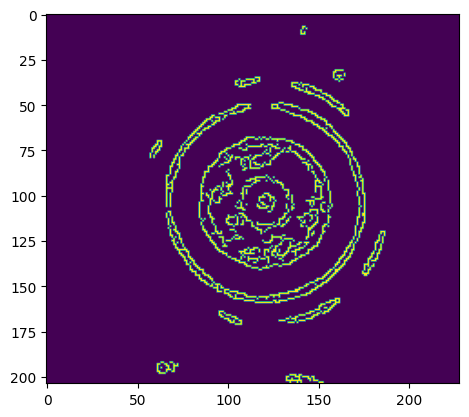

In [81]:
import cv2
import numpy as np

# Load the image
image_path = 'Test_8/frame_000001.png'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Normalize the image for better contrast
normalized_image = cv2.normalize(image, None, 0, 255, cv2.NORM_MINMAX)
imageHiContrast = cv2.convertScaleAbs(normalized_image, 10000, 2)


# adaptive_thresh = cv2.adaptiveThreshold(normalized_image, 255, 
#                                         cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
#                                         cv2.THRESH_BINARY_INV, 11, 2)

# Apply Canny edge detection on the high-contrast image
# edges = cv2.Canny(adaptive_thresh, threshold1=30, threshold2=150)

edges = cv2.Canny(imageHiContrast, threshold1=30, threshold2=150)
plt.imshow(edges)
plt.show()

# Set up the blob detector with parameters
params = cv2.SimpleBlobDetector_Params()
params.filterByCircularity = True
params.minCircularity = 0.7
params.filterByArea = True
params.minArea = 100
params.filterByConvexity = False

detector = cv2.SimpleBlobDetector_create(params)

# Detect blobs
keypoints = detector.detect(edges)

# Draw detected blobs as red circles and print the centers
for keypoint in keypoints:
    x, y = keypoint.pt
    radius = keypoint.size / 2
    cv2.circle(imageHiContrast, (int(x), int(y)), int(radius), (0, 0, 255), 2)
    print(f"Circle center: ({int(x)}, {int(y)}), Radius: {int(radius)}")

# Display the result with detected blobs
cv2.imshow("Detected Circles", imageHiContrast)
cv2.waitKey(0)
cv2.destroyAllWindows()


106.49701690673828 103.15969848632812


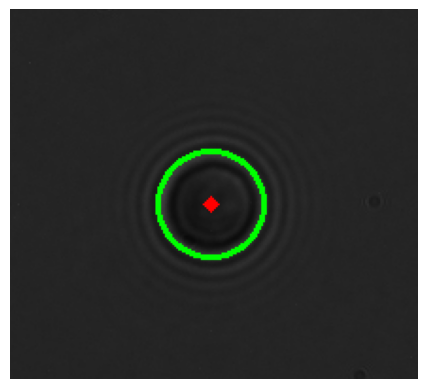

In [104]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image_path = 'Test_375/frame_000001.png'
img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Preprocess the image: apply Gaussian blur and binary threshold
blurred = cv2.GaussianBlur(img, (5, 5), 0)
_, thresh = cv2.threshold(blurred, 50, 255, cv2.THRESH_BINARY)

# Detect contours
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

# Create a copy of the image to draw the contours
output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

# Loop through contours and filter based on size and shape (circularity)
for contour in contours:
    # Fit a minimum enclosing circle around the contour
    ((x, y), radius) = cv2.minEnclosingCircle(contour)
    area = cv2.contourArea(contour)
    
    # Filter based on a minimum area and circularity condition
    if area > 100 and len(contour) > 5:
        # Draw the circle on the output image
        cv2.circle(output_img, (int(x), int(y)), int(radius), (0, 255, 0), 2)
        cv2.circle(output_img, (int(x), int(y)), 2, (0, 0, 255), 3)  # center point
        print(f'{x} {y}')

# Show the result
plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


# Autoencoder

In [87]:


output_path='Training_data'

# Define the Autoencoder
def create_autoencoder(input_shape):
    # Encoder
    input_img = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
    return autoencoder

# Prepare training data (assuming your images are already saved in `output_path`)
def load_images(output_path):
    images = []
    for filename in os.listdir(output_path):
        file_path = os.path.join(output_path, filename)
        img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (256, 256)) 
        img = img.astype('float32') / 255.  # Normalize to [0, 1]
        images.append(img)
    return np.array(images)

# Load and reshape images
images = load_images(output_path)
images = np.expand_dims(images, axis=-1)  # Add channel dimension

# Create and train the autoencoder
autoencoder = create_autoencoder((256,256, 1))
autoencoder.summary()

# Train the autoencoder
autoencoder.fit(images, images, epochs=50, batch_size=16, shuffle=True)

# Save the trained model
autoencoder.save('autoencoder_model_256.h5')


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 256, 256, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 256, 256, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 128, 128, 32)   │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_3 (UpSampling2D)  │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 256, 256, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 74,497 (291.00 KB)

 Trainable params: 74,497 (291.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 25s 705ms/step - loss: 0.5763
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 699ms/step - loss: 0.4589
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 695ms/step - loss: 0.4357
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 692ms/step - loss: 0.4331
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 727ms/step - loss: 0.4299
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 695ms/step - loss: 0.4291
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 709ms/step - loss: 0.4257
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 20s 700ms/step - loss: 0.4286
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 706ms/step - loss: 0.4284
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 24s 828ms/step - loss: 0.4262
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 24s 836ms/step - loss: 0.4280
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 719ms/step - loss: 0.4267
Epoch 13/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 716ms/step - loss: 0.4309
Epoch 14/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 722ms/step - loss: 0.4290
Epoch 15/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 21s 

In [24]:


output_path='Training_data'

# Define the Autoencoder
def create_autoencoder(input_shape):
    # Encoder
    input_img = layers.Input(shape=input_shape)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    encoded = layers.MaxPooling2D((2, 2), padding='same')(x)

    # Decoder
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(encoded)
    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D((2, 2))(x)
    decoded = layers.Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

    autoencoder = models.Model(input_img, decoded)
    autoencoder.compile(optimizer='adam', loss='binary_crossentropy')
    return autoencoder

# Prepare training data (assuming your images are already saved in `output_path`)
def load_images(output_path):
    images = []
    for filename in os.listdir(output_path):
        file_path = os.path.join(output_path, filename)
        img = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (128, 128)) 
        img = img.astype('float32') / 255.  # Normalize to [0, 1]
        images.append(img)
    return np.array(images)

# Load and reshape images
images = load_images(output_path)
images = np.expand_dims(images, axis=-1)  # Add channel dimension

# Create and train the autoencoder
autoencoder = create_autoencoder((128, 128, 1))
autoencoder.summary()

# Train the autoencoder
autoencoder.fit(images, images, epochs=50, batch_size=16, shuffle=True)

# Save the trained model
autoencoder.save('autoencoder_model.h5')


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 1)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 32)   │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 64, 64, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 64, 64, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 32, 32, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 32)     │        18,464 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 128, 128, 1)    │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 74,497 (291.00 KB)

 Trainable params: 74,497 (291.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 9s 176ms/step - loss: 0.5803
Epoch 2/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 175ms/step - loss: 0.4466
Epoch 3/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 173ms/step - loss: 0.4303
Epoch 4/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - loss: 0.4315
Epoch 5/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.4287
Epoch 6/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 179ms/step - loss: 0.4260
Epoch 7/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 174ms/step - loss: 0.4284
Epoch 8/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 170ms/step - loss: 0.4262
Epoch 9/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 165ms/step - loss: 0.4311
Epoch 10/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.4277
Epoch 11/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.4264
Epoch 12/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.4288
Epoch 13/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.4242
Epoch 14/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.4259
Epoch 15/50
29/29 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - lo

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 389ms/step


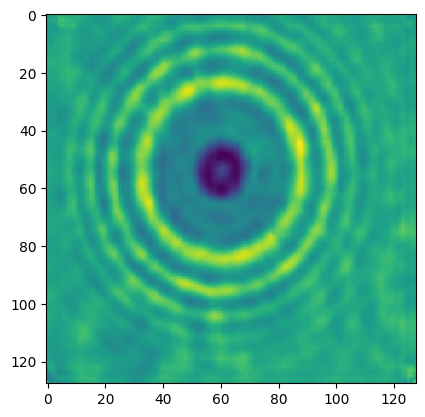

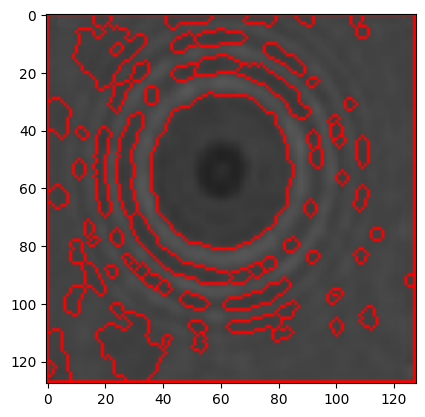

(128, 128)


error: OpenCV(4.10.0) :-1: error: (-5:Bad argument) in function 'circle'
> Overload resolution failed:
>  - Can't parse 'center'. Sequence item with index 0 has a wrong type
>  - Can't parse 'center'. Sequence item with index 0 has a wrong type


In [7]:
# Load the autoencoder model
autoencoder = tf.keras.models.load_model('autoencoder_model.h5')

def process_image_for_autoencoder(image):
    image = cv2.resize(image, (128, 128)) 
    image = image.astype('float32') / 255.  # Normalize to [0, 1]
    return image


output_path='Training_data'
for filename in os.listdir(output_path):
    file_path = os.path.join(output_path, filename)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    image = process_image_for_autoencoder(image)

    # Denoise using the autoencoder
    denoised_image = autoencoder.predict(np.expand_dims(image, axis=[0, -1]))[0]
    denoised_image = denoised_image[:, :, 0] * 255  # Rescale back to [0, 255]
    denoised_image = denoised_image.astype('uint16')

    
    plt.imshow(denoised_image)
    plt.show()
    
    # gray=cv2.cvtColor(denoised_image,cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(denoised_image,0,255,cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)
    # plt.imshow(thresh)
    # plt.show()

    # noise
    kernel = np.ones((3,3),np.uint8)
    opening = cv2.morphologyEx(thresh,cv2.MORPH_OPEN,kernel, iterations = 1)

    
    # background
    bg=cv2.dilate(opening,kernel,iterations=1)
    bg = np.uint8(bg)

    # foreground
    # dist_transform = cv2.distanceTransform(opening,cv2.DIST_L2,5)
    # ret, fg = cv2.threshold(dist_transform,0.7*dist_transform.max(),255,0)
    fg=cv2.erode(opening,kernel)

    # unknown regions (either bacground or foreground)
    fg = np.uint8(fg)
    unknown = cv2.subtract(bg,fg)
    # plt.imshow(unknown)
    # plt.imshow(opening)
    # plt.show()



    # markers for components
    ret,markers = cv2.connectedComponents(fg)
    markers = markers.astype(np.int32)
    markers=markers+1
    markers[unknown==255] = 0
    # markers=convert_to_cv32sc1(markers)
    # markers=convert_to_cv32sc1(markers)
    # image=convert_to_cv32sc1(denoised_image)
    denoised_image=np.uint8(denoised_image)
    denoised_image_color = cv2.cvtColor(denoised_image, cv2.COLOR_GRAY2BGR)

    # denoised_image_color = cv2.cvtColor(denoised_image.astype('uint8'), cv2.COLOR_GRAY2BGR)
    markers = cv2.watershed(denoised_image_color,markers)
    denoised_image_color[markers == -1] = [255,0,0]

    plt.imshow(denoised_image_color)
    plt.show()
    denoised_image_hough=np.uint8(denoised_image_color)

    if len(denoised_image_hough.shape) > 2:
        denoised_image_hough = denoised_image_hough[:, :, 0]
        denoised_image_hough = denoised_image_hough.astype(np.uint8)

    print(denoised_image_hough.shape)
    circles = cv2.HoughCircles(denoised_image_hough, 
                           cv2.HOUGH_GRADIENT, dp=1.5, minDist=30,
                           param1=50, param2=20, minRadius=20, maxRadius=150)
    # output_path = None
    if circles is not None:
        # Convert circles into integers
        circles = np.round(circles[0, :]).astype("int")

        # Sort circles by radius (largest first)
        circles = sorted(circles, key=lambda x: x[2], reverse=True)

        # Get the largest circle (first in sorted list)
        largest_circle = circles[0]

        # Create a copy of the original image to draw the circle
        output_image = cv2.cvtColor(denoised_image_hough, cv2.COLOR_GRAY2BGR)

        # Draw the largest circle
        cv2.circle(output_image, (largest_circle, largest_circle), largest_circle[2], (0, 255, 0), 4)

        # Optionally, draw the center of the circle
        cv2.circle(output_image, (largest_circle[0], largest_circle[1]), 2, (0, 0, 255), 3)

        # cv2.imwrite(output_path, output_image)
        plt.imshow(output_image)
        plt.show()
    
    # contourMarkersBW=cv2.cvtColor(denoised_image_color,cv2.COLOR_BGR2GRAY)
    # contourMarkers=cv2.convertScaleAbs(contourMarkersBW,100,5)
    # # plt.imshow(contourMarkers)
    # cnts=cv2.findContours(contourMarkers,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
    # cnts=cnts[0] if len(cnts)==2 else cnts[1]
    # for c in cnts:
    #     peri = cv2.arcLength(c,True)
    #     approx=cv2.approxPolyDP(c,0.04*peri,True)
    #     area=cv2.contourArea(c)
    #     if len(approx)>1 and area>1 and area<100:
    #         print("a")
    #         ((x,y),r)=cv2.minEnclosingCircle(c)
    #         cv2.circle(image,(int(x),int(y)),int(r),(255,255,255),2)

    # plt.imshow(markers)
    # plt.imshow(image)
    # plt.show()
# naudot vadovo hough ir palikt didziausia skrituli viduje vadovo kodo gautame skritulyje

# Vadovo autoencoder

# Pradinis autoencoder

In [ ]:
import cv2
from pathlib import Path
from PIL import Image, ImageSequence
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import fft2, fftshift, ifft2, ifftshift
from numpy import unravel_index
import pandas as pd

# params
r_in, r_out = 3, 5
ring_index=1


def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("PNG extraction done")

input_path = 'Tiffs'
input_tiff = "Test_375.tif"
output_base_path = "/Results/Test_375"
output_path = Path(output_base_path) / Path(input_tiff).stem
output_path.mkdir(parents=True, exist_ok=True)
tiff_to_png(input_tiff, input_path, output_path)

result_folder = "" + Path(input_tiff).stem + "_Results_bw37_2"
Path(result_folder).mkdir(parents=True, exist_ok=True)

error_log = []

autoencoder = tf.keras.models.load_model('autoencoder_model.h5')

def process_image_for_autoencoder(image):
    image = cv2.resize(image, (128, 128)) 
    image = image.astype('float32') / 255.  # Normalize to [0, 1]
    return image


for filename in os.listdir(output_path):
    file_path = os.path.join(output_path, filename)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    image = process_image_for_autoencoder(image)

    # Denoise using the autoencoder
    denoised_image = autoencoder.predict(np.expand_dims(image, axis=[0, -1]))[0]
    denoised_image = denoised_image[:, :, 0] * 255  # Rescale back to [0, 255]
    denoised_image = denoised_image.astype('uint16')

    # image = cv2.cvtColor(denoised_image, cv2.COLOR_BGR2GRAY)
    print(image.shape)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.ravel()

    axes[0].imshow(image, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original Image')

    image = cv2.convertScaleAbs(image,30,2.5)

    ftimage = fft2(image)
    ftimage = fftshift(ftimage)
    axes[1].imshow(20 * np.log(np.abs(ftimage) + 1), cmap='gray', vmin=0, vmax=255)
    axes[1].set_title('Fourier Transform')

    # rows, cols = ftimage.shape
    rows,cols=ftimage.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=np.uint8)
    # r_in, r_out = 3, 7
    x, y = np.ogrid[:rows, :cols]
    mask_area = np.logical_and(((x - crow)**2 + (y - ccol)**2 >= r_in**2),
                               ((x - crow)**2 + (y - ccol)**2 <= r_out**2))
    mask[mask_area] = 1
    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Bandpass Filter')

    m_app_ftimage = ftimage * mask
    i_ftimage = ifftshift(m_app_ftimage)
    result_img = ifft2(i_ftimage)
    tmp = np.log(np.abs(result_img) + 1)
    axes[3].imshow(tmp, cmap='gray', vmin=tmp.min(), vmax=tmp.max())
    axes[3].set_title('Filtered Image')

    axes[4].plot(tmp[int(tmp.shape[0]/2), :], color='blue')
    axes[4].set_title('Intensity Profile')

    crow, ccol = unravel_index(tmp.argmax(), tmp.shape)
    central_line_y = tmp[crow, :]
    central_line_x = tmp[:, ccol]

    peaks_y, _ = find_peaks(central_line_y, height=0.1)
    peaks_x, _ = find_peaks(central_line_x, height=0.1)

    if len(peaks_x) > 1 and len(peaks_y) > 1:
        # Adjusted peak selection to use closest peaks around ccol
        closest_peak_x = min(peaks_x, key=lambda x: abs(x-ccol))
        closest_peak_y = min(peaks_y, key=lambda y: abs(y-crow))

        # Use peak indices to find distances to closest peaks
        peak_index_x = peaks_x.tolist().index(closest_peak_x)
        peak_index_y = peaks_y.tolist().index(closest_peak_y)

        if peak_index_x > 0:
            rl_x = ccol - peaks_x[peak_index_x - ring_index]
            rr_x = peaks_x[peak_index_x + ring_index] - ccol

        if peak_index_y > 0:
            ru_y = crow - peaks_y[peak_index_y - ring_index]
            rl_y = peaks_y[peak_index_y + ring_index] - crow

        circle_radius = round((rl_x + rr_x + ru_y + rl_y) / 4., 0)
        circle_img = cv2.circle(image.copy(), (ccol, crow), int(circle_radius), (255, 0, 0), 2)

        axes[5].imshow(circle_img, cmap='gray', vmin=0, vmax=255)
        axes[5].set_title('Result with Circle')
    else:
        error_log.append([filename, 'Frame with no valid peaks', r_in, r_out, 2])
        axes[5].imshow(image, cmap='gray', vmin=0, vmax=255)
        axes[5].set_title('Result with Circle (No valid peaks)')

    plt.tight_layout()
    plt.savefig(os.path.join(result_folder, f"composite_{filename}"))
    plt.show()

if error_log:
    # Only save the CSV if there are errors
    error_df = pd.DataFrame(error_log, columns=['File', 'Frame', 'Band width r_in', 'Band width r_out', 'Value subtracted/added'])
    error_csv_path = Path('/content/drive/MyDrive/Magistras/Errors_06_06') / f"errors_{Path(input_tiff).stem}.csv"
    error_df.to_csv(error_csv_path, index=False)
    print("Error log saved to CSV.")
else:
    print("No errors to log.")

print("All images processed and saved in the results folder.")


# Test peak smoothing

In [113]:
def circle_radius_fun(peaks_x,peaks_y,ring_index,ccol,crow):
    # Adjusted peak selection to use closest peaks around ccol
    closest_peak_x = min(peaks_x, key=lambda x: abs(x-ccol))
    closest_peak_y = min(peaks_y, key=lambda y: abs(y-crow))

    # Use peak indices to find distances to closest peaks
    peak_index_x = peaks_x.tolist().index(closest_peak_x)
    peak_index_y = peaks_y.tolist().index(closest_peak_y)
    # peak_index_x=peaks_x.index(closest_peak_x)
    # peak_index_y=peaks_y.index(closest_peak_y)

    if peak_index_x > 0:
        rl_x = ccol - peaks_x[peak_index_x - ring_index]
        rr_x = peaks_x[peak_index_x + ring_index] - ccol

    if peak_index_y > 0:
        ru_y = crow - peaks_y[peak_index_y - ring_index]
        rl_y = peaks_y[peak_index_y + ring_index] - crow


    return round((rl_x + rr_x + ru_y + rl_y) / 4., 0)

In [150]:
def circle_change_limiter(circle_radius,prev_circle_radius,allowed_change,ring_index):
    if prev_circle_radius is not None and circle_radius > prev_circle_radius * 1+allowed_change:
        ring_index=ring_index-1
        # ccol=prev_ccol
        # crow=prev_crow
        circle_radius=circle_radius_fun(peaks_x,peaks_y,ring_index,ccol,crow)
    elif prev_circle_radius is not None and circle_radius < prev_circle_radius * 1-allowed_change:
        ring_index=ring_index+1
        # ccol=prev_ccol
        # crow=prev_crow
        circle_radius=circle_radius_fun(peaks_x,peaks_y,ring_index,ccol,crow)
    return circle_radius,ring_index

In [114]:

def process_image_for_autoencoder(image):
    image = cv2.resize(image, (256, 256)) 
    image = image.astype('float32') / 255.  # Normalize to [0, 1]
    return image

In [115]:
def hough_circles(image):
    cimg=image.copy()
    cimg = cv2.medianBlur(cimg,5)
    # circles = cv2.HoughCircles(cimg,cv2.HOUGH_GRADIENT,1,20,
    #                         param1=50,param2=30,minRadius=0,maxRadius=0)
    circles = cv2.HoughCircles(cimg, cv2.HOUGH_GRADIENT, dp=1, minDist=0.001,
                           param1=100, param2=20, minRadius=15, maxRadius=150)

    circles = np.uint16(np.around(circles))
    # print(len(circles))
    for i in circles[0,:]:
        # draw the outer circle
        cv2.circle(cimg,(i[0],i[1]),i[2],(0,255,0),2)
        # draw the center of the circle
        cv2.circle(cimg,(i[0],i[1]),2,(0,0,255),3)
    return cimg

In [152]:
def refine_center(image,ccol,crow):
    img=image.copy()
    min_distance=999
    blurred = cv2.GaussianBlur(img, (5, 5), 0)
    _, thresh = cv2.threshold(blurred, 50, 255, cv2.THRESH_BINARY)

    # Detect contours
    contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    # Create a copy of the image to draw the contours
    output_img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

    # Loop through contours and filter based on size and shape (circularity)
    for contour in contours:
        # Fit a minimum enclosing circle around the contour
        ((x, y), radius) = cv2.minEnclosingCircle(contour)
        area = cv2.contourArea(contour)
        
        # Filter based on a minimum area and circularity condition
        if area > 100 and len(contour) > 5:
            # Draw the circle on the output image
            cv2.circle(output_img, (int(x), int(y)), int(radius), (0, 255, 0), 2)
            cv2.circle(output_img, (int(x), int(y)), 2, (0, 0, 255), 3)  # center point
            # print(f'{x} {y}')

            # distance between ccol and newly detected circle centers
            distance = math.sqrt((ccol - x)**2 + (crow - y)**2)

            if distance < min_distance:
                min_distance = distance
                closest_center = (int(x), int(y))
    # plt.imshow(cv2.cvtColor(output_img, cv2.COLOR_BGR2RGB))
    # plt.axis('off')
    # plt.show()
    return closest_center


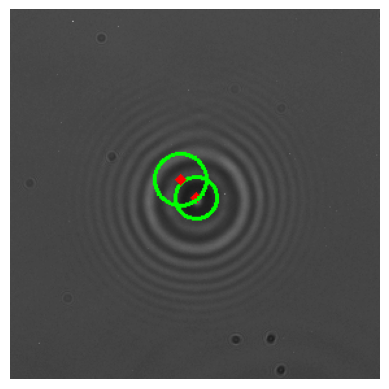

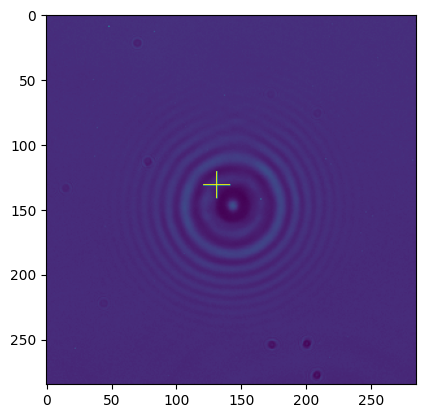

131 131


In [145]:
image=cv2.imread('Test_5/frame_000003.png',cv2.IMREAD_GRAYSCALE)
ccol,crow=2,3
imageBright = cv2.convertScaleAbs(image,10,1.5)
ccol,crow=refine_center(imageBright,ccol,crow)

cv2.line(image, (ccol, crow - 10), (ccol, crow + 10), (255, 255, 255), 1)
cv2.line(image,(ccol - 10, crow), (ccol + 10, crow), (255, 255, 255), 1)
plt.imshow(image)
plt.show()
print(ccol,crow)

In [ ]:
import cv2
from pathlib import Path
from PIL import Image, ImageSequence
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from numpy.fft import fft2, fftshift, ifft2, ifftshift
from numpy import unravel_index
import pandas as pd

autoencoder = tf.keras.models.load_model('autoencoder_model_256.h5')

# params
# r_in, r_out = 3, 9
r_in, r_out = 3,6
ring_index=1

#  For guarding against index changes
prev_circle=None
prev_circle_radius=None
# allowed_circle_radius_upper=1.1 #circle_radius can differ by max this percent
# allowed_circle_radius_lower=0.9
allowed_change=0.1
prev_ccol=None
prev_crow=None

cross_length = 10 #Check if the center is correctly placed


def tiff_to_png(input_tiff, input_path, output_path):
    try:
        sq = Image.open(os.path.join(input_path, input_tiff))
        for i, img in enumerate(ImageSequence.Iterator(sq)):
            output = os.path.join(output_path, f"frame_{i:06d}.png")
            img.save(output)
    finally:
        print("PNG extraction done")

input_path = 'Tiffs'
input_tiff = "Test_375.tif"
output_base_path = "/Results/Test_375"
output_path = Path(output_base_path) / Path(input_tiff).stem
output_path.mkdir(parents=True, exist_ok=True)
tiff_to_png(input_tiff, input_path, output_path)

result_folder = "" + Path(input_tiff).stem + "_Results_bw37_j"
Path(result_folder).mkdir(parents=True, exist_ok=True)

error_log = []

for filename in os.listdir(output_path):
    file_path = os.path.join(output_path, filename)
    image = cv2.imread(file_path, cv2.IMREAD_GRAYSCALE)
    imageBright = cv2.convertScaleAbs(image,10,1.5)
    

    # image_auto = process_image_for_autoencoder(image)

    # denoised_image = autoencoder.predict(np.expand_dims(image_auto, axis=[0, -1]))[0]
    # denoised_image = denoised_image[:, :, 0] * 255  # Rescale back to [0, 255]
    # denoised_image = denoised_image.astype('uint16')
    # cimg=hough_circles(image)
    # plt.imshow(cimg)
    # plt.show()


    # fig, axes = plt.subplots(2, 3, figsize=(15, 10)) #Orig
    fig, axes = plt.subplots(2, 4, figsize=(15, 10))
    axes = axes.ravel()

    axes[0].imshow(imageBright, cmap='gray', vmin=0, vmax=255)
    axes[0].set_title('Original Image')

    ftimage = fft2(imageBright)
    ftimage = fftshift(ftimage)
    axes[1].imshow(20 * np.log(np.abs(ftimage) + 1), cmap='gray', vmin=0, vmax=255)
    axes[1].set_title('Fourier Transform')

    rows, cols = ftimage.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), dtype=np.uint8)
    # r_in, r_out = 3, 7
    x, y = np.ogrid[:rows, :cols]
    mask_area = np.logical_and(((x - crow)**2 + (y - ccol)**2 >= r_in**2),
                               ((x - crow)**2 + (y - ccol)**2 <= r_out**2))
    mask[mask_area] = 1
    axes[2].imshow(mask, cmap='gray')
    axes[2].set_title('Bandpass Filter')

    m_app_ftimage = ftimage * mask
    i_ftimage = ifftshift(m_app_ftimage)
    result_img = ifft2(i_ftimage)
    tmp = np.log(np.abs(result_img) + 1)
    axes[3].imshow(tmp, cmap='gray', vmin=tmp.min(), vmax=tmp.max())
    axes[3].set_title('Filtered Image')

    axes[4].plot(tmp[int(tmp.shape[0]/2), :], color='blue')
    axes[4].set_title('Intensity Profile')

    crow, ccol = unravel_index(tmp.argmax(), tmp.shape)
    print(tmp.shape)
    # smoothed_intensity = moving_average(tmp, window_size=8)
    # print(smoothed_intensity.shape)
    # ccol,crow = unravel_index(tmp.argmax(), tmp.shape)
    # print(f'{crow} {ccol}')
    ccol,crow=refine_center(imageBright,crow,ccol)

    # crow,ccol=refine_center(image,crow,ccol)
    # print(f'{crow} {ccol}')
    
    central_line_y = tmp[crow, :]
    central_line_x = tmp[:, ccol]

    smoothed_central_line_y = moving_average(central_line_y, window_size=8)
    smoothed_central_line_x = moving_average(central_line_x, window_size=8)

    # peaks_y, _ = find_peaks(central_line_y, height=0.1)
    # peaks_x, _ = find_peaks(central_line_x, height=0.1)

    peaks_y, _ = find_peaks(smoothed_central_line_y, height=0.1)
    peaks_x, _ = find_peaks(smoothed_central_line_x, height=0.1)

    # peaks_x=merge_peaks_by_distance(peaks_x,3)
    # peaks_y=merge_peaks_by_distance(peaks_y,3)

    if len(peaks_x) > 1 and len(peaks_y) > 1:
        circle_radius = circle_radius_fun(peaks_x,peaks_y,ring_index,ccol,crow)


        circle_radius,ring_index=circle_change_limiter(circle_radius,prev_circle_radius,allowed_change,ring_index)
            
        circle_img = cv2.circle(image.copy(), (ccol, crow), int(circle_radius), (255, 0, 0), 2)
        # circle_img = cv2.circle(denoised_image.copy(), (ccol, crow), int(circle_radius), (255, 0, 0), 2)
        cv2.line(circle_img,(ccol - cross_length, crow), (ccol + cross_length, crow), (255, 255, 255), 1)
        cv2.line(circle_img, (ccol, crow - cross_length), (ccol, crow + cross_length), (255, 255, 255), 1)
        axes[5].imshow(circle_img, cmap='gray', vmin=0, vmax=255)
        axes[5].set_title('Result with Circle')
    else:
        error_log.append([filename, 'Frame with no valid peaks', r_in, r_out, 2])
        axes[5].imshow(image, cmap='gray', vmin=0, vmax=255)
        axes[5].set_title('Result with Circle (No valid peaks)')

    # Plot intensity profiles and highlight peaks
    axes[6].plot(smoothed_central_line_y, color='blue')
    for peak in peaks_y:
        axes[6].axvline(x=peak, color='red', linestyle='--')  # Mark peaks with red dashed lines
    axes[6].set_title('Intensity Profile (Y-Axis) with Peaks')

    axes[7].plot(smoothed_central_line_x, color='green')
    for peak in peaks_x:
        axes[7].axvline(x=peak, color='red', linestyle='--')  # Mark peaks with red dashed lines
    axes[7].set_title('Intensity Profile (X-Axis) with Peaks')

    prev_circle_radius=circle_radius
    prev_ccol=ccol
    prev_crow=crow


    plt.tight_layout()
    plt.savefig(os.path.join(result_folder, f"composite_{filename}"))
    plt.show()

if error_log:
    # Only save the CSV if there are errors
    error_df = pd.DataFrame(error_log, columns=['File', 'Frame', 'Band width r_in', 'Band width r_out', 'Value subtracted/added'])
    error_csv_path = Path('/content/drive/MyDrive/Magistras/Errors_06_06') / f"errors_{Path(input_tiff).stem}.csv"
    error_df.to_csv(error_csv_path, index=False)
    print("Error log saved to CSV.")
else:
    print("No errors to log.")

print("All images processed and saved in the results folder.")
